# Import what we need

In [1]:
import sys
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
from scipy.sparse import csr_matrix
import logging
import os
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import math
import gc
import random
from sklearn.utils import shuffle

The current input file is /ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/CLUESImmVar_processed.h5ad with a time stamp of 01/03/2019

In [2]:
%matplotlib inline

##################
# Configure file #
##################
sc.settings.verbosity = 2
sc.settings.autoshow = False

sc.settings.set_figure_params(dpi=100, dpi_save=600, format='png')

plt.rcParams["image.aspect"] = "equal"

# Read in the data, this could take a while

In [3]:
version = "V6"

dirpath = os.getcwd()
name = "CLUESImmVar_processed."+version
processed_path = name+'.h5ad';
print(processed_path)
adata = sc.read(processed_path, cache=True)
adata.shape

figdir = "./figures."+version+"/"
sc.settings.figdir = "./figures."+version+"/"

CLUESImmVar_processed.V6.h5ad


In [4]:
## since we have replicates, let's sort adata in a consistent way
adata_obs_sorted = adata.obs.sort_values(by=['disease_cov','ind_cov','batch_cov'], ascending=False);
adata = adata[adata_obs_sorted.index]

In [5]:
adata.obs['site'] = pd.Categorical(adata.obs.disease_cov, categories=['Broad','UCSF'])
adata.obs.site[adata.obs.batch_cov.str.contains("immvar")] = "Broad"
adata.obs.site[~adata.obs.batch_cov.str.contains("immvar")] = "UCSF"

adata.obs['disease_pop_site_cov'] = pd.Categorical(adata.obs.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)

Trying to set attribute `.obs` of view, making a copy.


In [6]:
adata.obs.to_csv('adata.obs.txt')

# Figure 1B: Projection and dropprint

## Next, make the disease plot

In [7]:
sc.tl.embedding_density(adata, basis='umap', groupby='disease_pop_site_cov')

computing density on 'umap'


saving figure to file ./figures.V6/umap_density_disease_pop_site_cov_.density.png


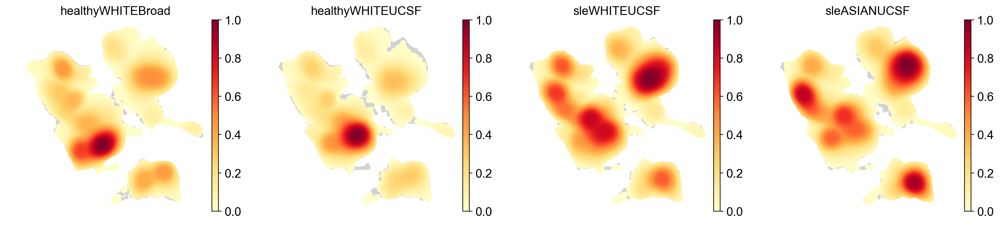

In [8]:
disease_umap = sc.pl.embedding_density(adata, basis="umap", key="umap_density_disease_pop_site_cov", frameon=False)
disease_umap = sc.pl.embedding_density(adata, basis="umap", key="umap_density_disease_pop_site_cov", frameon=False, save=".density.png")

## Now, let's make a plot for each of the 16 people in batch 1 as a demo of variability

# Figure 1C: Cell type annotation of projection

## First, let's make the Leiden plot

saving figure to file ./figures.V6/umap.leiden.png


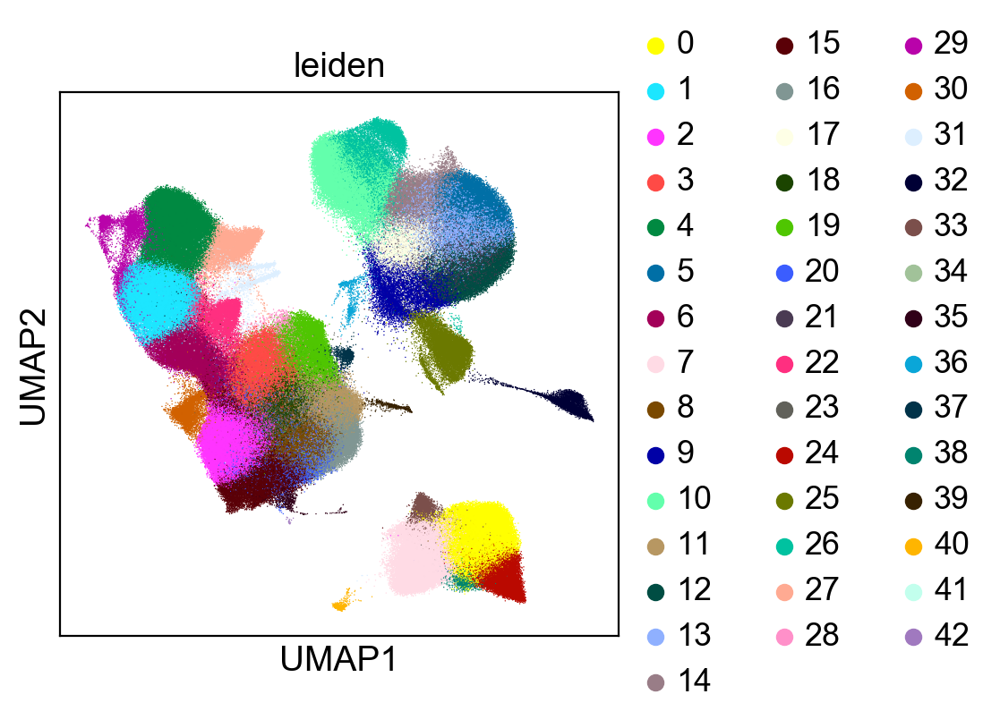

In [9]:
sc.pl.umap(adata, color='leiden',size=1, edgecolor="none")
sc.pl.umap(adata, color='leiden', size=1, edgecolor="none", save='.leiden.png')

In [6]:
##4/11 annotations
adata.obs.ct_cov = adata.obs.ct_cov.astype("str")
# ## do some manual cell type assignment
adata.obs.ct_cov.loc[adata.obs.leiden == "0"] = "B" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "1"] = "Tc" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "2"] = "Tc" ## good                                                                                     
adata.obs.ct_cov.loc[adata.obs.leiden == "3"] = "Tc" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "4"] = "NK" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "5"] = "cM" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "6"] = "Tc" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "7"] = "B" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "8"] = "Th" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "9"] = "cM" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "10"] = "ncM" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "11"] = "Th" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "12"] = "cM" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "13"] = "cM" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "14"] = "cM" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "15"] = "Th" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "16"] = "Th" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "17"] = "cM" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "18"] = "Th" ## good                                                                              
adata.obs.ct_cov.loc[adata.obs.leiden == "19"] = "Th" ## good                                                                               
adata.obs.ct_cov.loc[adata.obs.leiden == "20"] = "Th" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "21"] = "cM" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "22"] = "Tc" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "23"] = "Th" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "24"] = "B" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "25"] = "cDC" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "26"] = "ncM" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "27"] = "NK" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "28"] = "Th" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "29"] = "NK" ## good                                                                               
adata.obs.ct_cov.loc[adata.obs.leiden == "30"] = "DB" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "31"] = "ProlifT" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "32"] = "pDC" ## good
adata.obs.ct_cov.loc[adata.obs.leiden == "33"] = "B" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "34"] = "cM" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "35"] = "DB" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "36"] = "MK" ## good                                                                                   
adata.obs.ct_cov.loc[adata.obs.leiden == "37"] = "DB" ## good                                                                                  
adata.obs.ct_cov.loc[adata.obs.leiden == "38"] = "B" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "39"] = "Progen" ## good                                                                               
adata.obs.ct_cov.loc[adata.obs.leiden == "40"] = "B" ## good 
adata.obs.ct_cov.loc[adata.obs.leiden == "41"] = "DB" ## good                                                                                    
adata.obs.ct_cov.loc[adata.obs.leiden == "42"] = "DB" ## good
adata.obs.ct_cov.loc[adata.obs.leiden == "43"] = "DB" ## good
adata.obs.ct_cov = adata.obs.ct_cov.astype('category')

/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


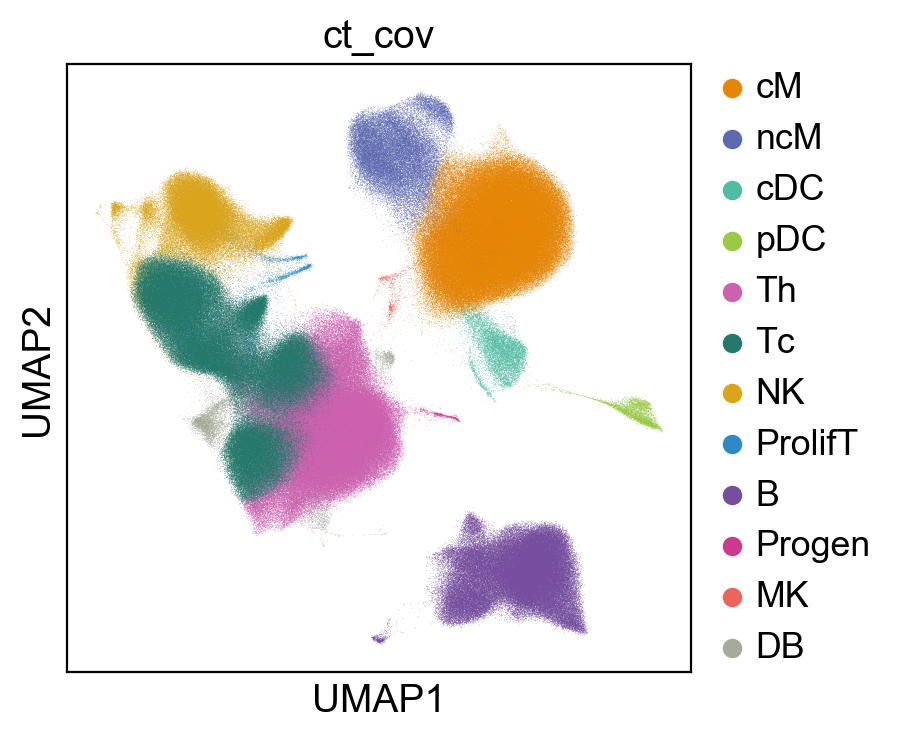

In [7]:
## Make cell type plot (Fig. 1C)
adata.obs.ct_cov = adata.obs.ct_cov.cat.reorder_categories(['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B', 'Progen', 'MK', 'DB'])

adata.uns['ct_cov_colors'] = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#CC3A8E","#ED645A","#A5AA99"]

celltype_umap = sc.pl.umap(adata, color='ct_cov', size=0.2, edgecolor="none", save='.celltype.png')
celltype_umap = sc.pl.umap(adata, color='ct_cov',size=0.2, edgecolor="none")

In [13]:
sc.tl.rank_genes_groups(adata, groupby="ct_cov", use_raw=True, n_genes=adata.shape[1])


ranking genes
    finished (0:06:02.51)


In [14]:
pd.DataFrame(adata.uns["rank_genes_groups"]['names']).to_csv("rank_gene_groups.txt")

### make all batches

In [15]:
# ## let's plot 16 plots for the individuals in the first batch (Fig. 1B)

# for batch_i in range(7,14): ##range(len(adata.obs.batch_cov.unique())) :
#     fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7),sharex=True, sharey=True)
#     fig.tight_layout()
#     plt.subplots_adjust(wspace=-0.1, hspace=0)

#     batch_name = adata.obs.batch_cov.unique()[batch_i]
#     batch = adata.obs.ind_cov[adata.obs.batch_cov==batch_name].unique();
#     batch = np.sort(batch.categories.values)

#     for ind_i in list(range(batch.shape[0])) :
#         ind = batch[ind_i]

#         sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ct_cov", title=None, ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=20, edgecolor="none")
        
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
#         ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")
    
#     fig.savefig(figdir+'/'+batch_name+'.ind.png')

### make only the first batch

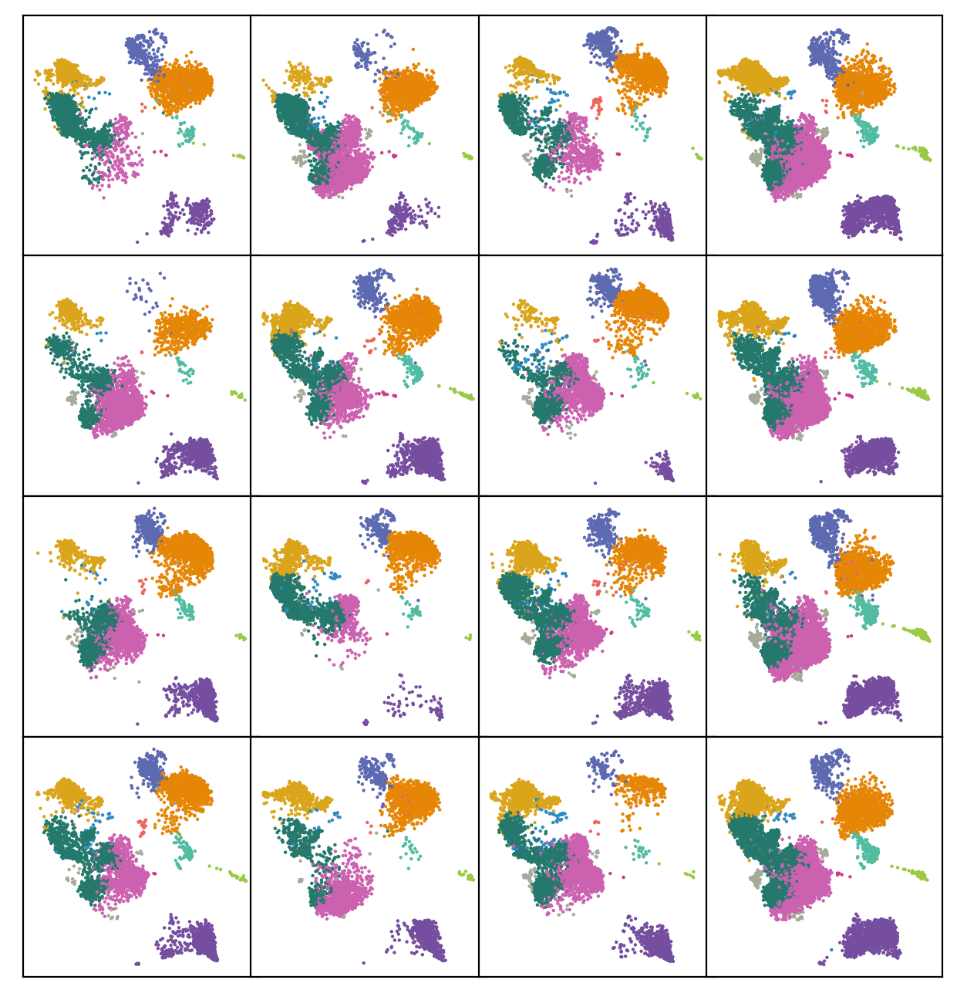

In [8]:
batch_07_19_inds = adata.obs.ind_cov[adata.obs.batch_cov=='lupus7.19'].unique()
batch_07_19_inds = np.sort(batch_07_19_inds.categories.values);

fig,ax = plt.subplots(nrows=4,ncols=4, figsize=(7,7), sharex=True, sharey=True)
fig.tight_layout()
plt.subplots_adjust(wspace=-0.1, hspace=0)

for ind_i in list(range(batch_07_19_inds.shape[0])) :
    ind = batch_07_19_inds[ind_i]
    
    sc.pl.umap(adata[adata.obs.ind_cov==ind,], color = "ct_cov", title=None, ax=ax[(ind_i-1)%4,math.floor(ind_i/4)], size=10, edgecolor="none")
    
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_xaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_yaxis().set_visible(False)
    ax[(ind_i-1)%4,math.floor(ind_i/4)].get_legend().remove()
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_title("")
    ax[(ind_i-1)%4,math.floor(ind_i/4)].set_aspect("equal")

fig.savefig(figdir+'/umap.ind.png')

In [9]:
# ##4/10 annotations

# adata.obs.ct_cov = adata.obs.ct_cov.astype("str")
# # ## do some manual cell type assignment
# adata.obs.ct_cov.loc[adata.obs.louvain == "0"] = "Tc" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "1"] = "B" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "2"] = "Tc" ## good                                                                                     
# adata.obs.ct_cov.loc[adata.obs.louvain == "3"] = "Tc" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "4"] = "NK" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "5"] = "Tc" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "6"] = "cM" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "7"] = "Th" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "8"] = "cM" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "9"] = "Th" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "10"] = "cM" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.louvain == "11"] = "ncM" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "12"] = "cM" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "13"] = "cM" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "14"] = "B" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.louvain == "15"] = "cM" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "16"] = "Th" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "17"] = "Th" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.louvain == "18"] = "Th" ## good                                                                              
# adata.obs.ct_cov.loc[adata.obs.louvain == "19"] = "Th" ## good                                                                               
# adata.obs.ct_cov.loc[adata.obs.louvain == "20"] = "cDC" ## good 
# adata.obs.ct_cov.loc[adata.obs.louvain == "21"] = "Th" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "22"] = "B" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "23"] = "Th" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "24"] = "ncM" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.louvain == "25"] = "NK" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "26"] = "Tc" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "27"] = "Th" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.louvain == "28"] = "NK" ## good 
# adata.obs.ct_cov.loc[adata.obs.louvain == "29"] = "DB" ## good                                                                               
# adata.obs.ct_cov.loc[adata.obs.louvain == "30"] = "pDC" ## good 
# adata.obs.ct_cov.loc[adata.obs.louvain == "31"] = "ProlifT" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "32"] = "B" ## good
# adata.obs.ct_cov.loc[adata.obs.louvain == "33"] = "B" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "34"] = "Th" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.louvain == "35"] = "Th" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "36"] = "DB" ## good                                                                                   
# adata.obs.ct_cov.loc[adata.obs.louvain == "37"] = "cM" ## good                                                                                  
# adata.obs.ct_cov.loc[adata.obs.louvain == "38"] = "MK" ## good 
# adata.obs.ct_cov.loc[adata.obs.louvain == "39"] = "B" ## good                                                                               
# adata.obs.ct_cov.loc[adata.obs.louvain == "40"] = "DB" ## good 
# adata.obs.ct_cov.loc[adata.obs.louvain == "41"] = "Progen" ## good                                                                                    
# adata.obs.ct_cov.loc[adata.obs.louvain == "42"] = "B" ## good
# adata.obs.ct_cov = adata.obs.ct_cov.astype('category')

# sc.tl.louvain(adata, random_state=30, resolution=2)
# sc.pl.umap(adata, color='louvain',size=1, edgecolor="none")
# sc.pl.umap(adata, color='louvain', size=1, edgecolor="none", save='.louvain.png')

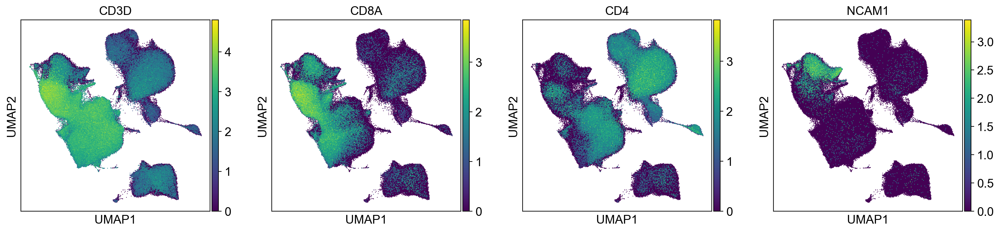

In [10]:
## CD4, CD8 and NK axis
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1"],size=3)
sc.pl.umap(adata, color=["CD3D","CD8A","CD4","NCAM1"],size=3, save=".TNK.png")

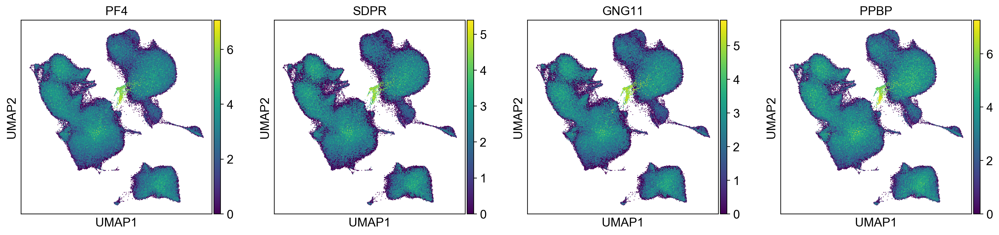

In [11]:
## platelet effect
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3)
sc.pl.umap(adata, color=["PF4", "SDPR", "GNG11", "PPBP"], size=3, save='.platelet.png')

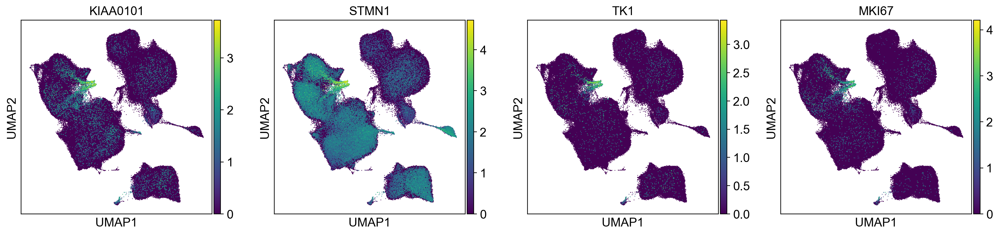

In [12]:
## cycling
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3)
sc.pl.umap(adata, color=["KIAA0101","STMN1","TK1","MKI67"], size=3, save='.cycling.png')

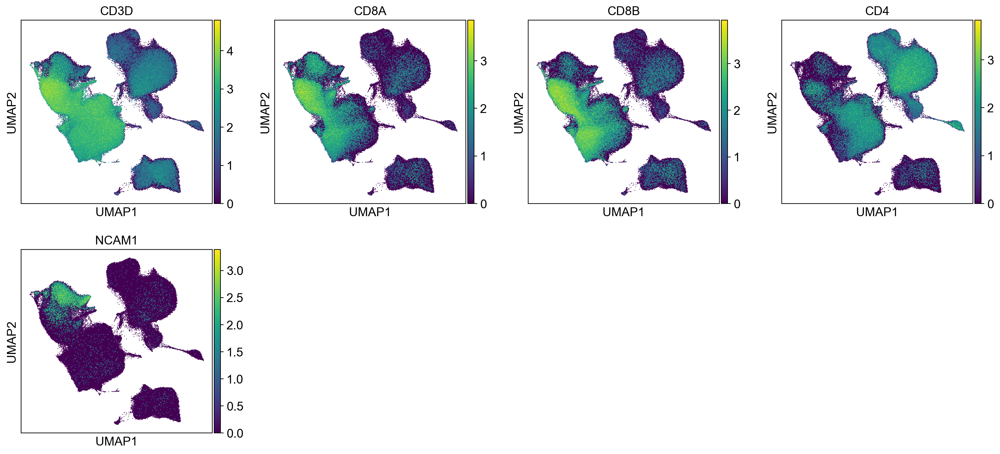

In [13]:
## CD4, CD8 and NK axis
sc.pl.umap(adata, color=["CD3D","CD8A","CD8B","CD4","NCAM1"],size=3)
sc.pl.umap(adata, color=["CD3D","CD8A","CD8B","CD4","NCAM1"],size=3, save=".TNK.png")

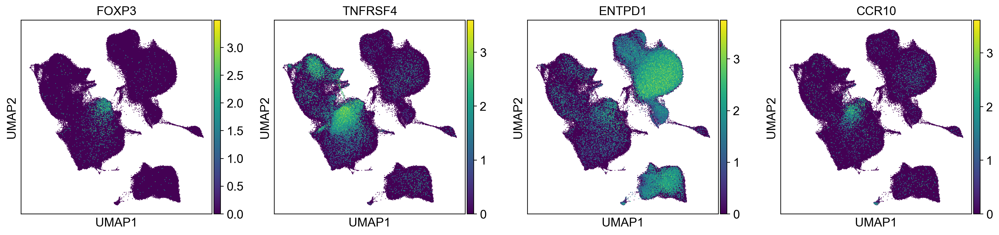

In [14]:
## treg
sc.pl.umap(adata, color=["FOXP3","TNFRSF4","ENTPD1","CCR10"],size=3)

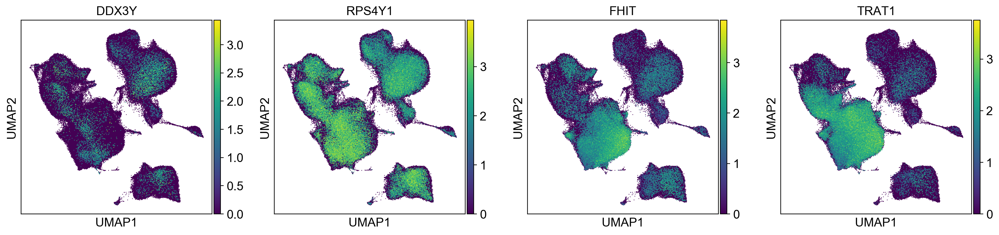

In [15]:
## y chromosome gender effect
sc.pl.umap(adata, color=["DDX3Y", "RPS4Y1", "FHIT","TRAT1"], size =3)

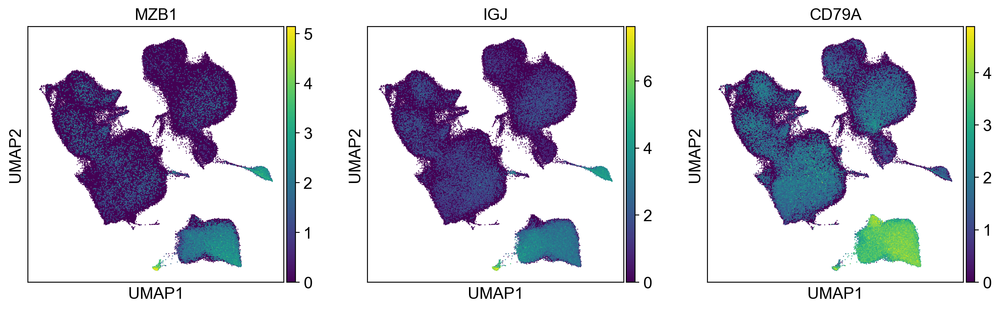

In [16]:
## b cells, plasmablasts and pdcs
sc.pl.umap(adata, color=["MZB1", "IGJ", "CD79A"],size=3)

# Figure 1D: Cell type proportion differences between case/control

## Cell proportion analysis using Broad ImmVar

In [17]:
## Make proportion plots (Fig. 1D)

adata_obs_small = adata.obs[(adata.obs.well.str.contains("immvar")) & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & ~adata.obs.well.str.contains("immvar"))]
##adata_obs_small = adata.obs[(adata.obs.batch_cov.str.contains("lupus"))]

##ind_count = adata_obs_small.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov',"batch_cov"])['ct_cov'].count()

##ind_count = adata.obs.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()
##ind_count = adata.obs.groupby(['ind_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ind_count_sums = ind_count.groupby(level=[0]).sum()
ind_count_sums = ind_count_sums.reset_index(name="pbmc_counts")

ind_perc = ind_count/ind_count.groupby(level=[0]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")

# Add weights to WLS
ind_perc['ct_counts'] = ind_count.values.tolist()

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov.isin(ind_count_sums.ind_cov[ind_count_sums.pbmc_counts > 100])]

##ct_group = pd.DataFrame( {'ct_cov':['B','CD14 Monoc','CD16 Monoc', 'CD4+ T', 'CD8+ T', 'MK', 'NK', 'cDC', 'pDC','Progenitor','Proliferat'], 'ct_group':['lymph', 'mono', 'mono', 'lymph','lymph', 'mkc','lymph','dc','pdc','progen','lymph']})
cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'ProlifT', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'cdc','pdc', 'mk', 'progen']})
ind_perc.ind_cov = ind_perc.ind_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov = ind_count_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov = ind_perc.ind_cov.astype("str")
##ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

print('as a proportion of total PBMC ')

all_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(all_out) 
##print(all_out)

print('\nwhite sle vs white healthy')

white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.pop_cov=="WHITE"].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[ind_perc.pop_cov=="WHITE"].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    white_out = white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(white_out)  
##print(white_out)

print('\nasian sle vs white healthy')

asian_sle_white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_sle_white_out = asian_sle_white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_sle_white_out); ##print(white_out)    
     
print('\nwhite sle vs asian sle')

asian_white_sle_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.disease_cov=="sle"].ct_perc[ind_perc.ct_cov==ct]
    pop = ind_perc[ind_perc.disease_cov=="sle"].pop_cov[ind_perc.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), pop.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_white_sle_out = asian_white_sle_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_white_sle_out); ##print(white_out)    
    

as a proportion of total PBMC 


,Beta,Cell,Pval
0,-10.70215687266923,cM,3.198338396957655e-09
1,-1.2798364638860427,ncM,0.004750636736717552
2,0.18761313225680998,cDC,0.08281408717930125
3,0.5533399839064378,pDC,5.197888963028606e-23
4,13.928725347625612,Th,1.8166715048128082e-18
5,-3.988252180754369,Tc,0.005112266313162596
6,1.0787635118147887,NK,0.14114891376284938
7,-0.3070669656367684,ProlifT,0.0009467845354755533
8,0.9256116168488865,B,0.5079207627684978
9,-0.01811699539235443,Progen,0.11138418694702693



white sle vs white healthy


,Beta,Cell,Pval
0,-10.642416307088645,cM,1.4304715641729317e-07
1,-1.8173189757436066,ncM,0.00046289397437105544
2,0.13308450217701248,cDC,0.2662713492871153
3,0.5194300062161019,pDC,2.1080451776735008e-12
4,11.201727379661918,Th,7.142974866508968e-10
5,-2.3884313388585907,Tc,0.11003893521601171
6,0.10413986706418699,NK,0.9035133701977087
7,-0.19368593593326813,ProlifT,0.033391871941403584
8,3.561984997257267,B,0.005709169234107104
9,-0.025626655654625453,Progen,0.02169404580480207



asian sle vs white healthy


,Beta,Cell,Pval
0,-10.755259597629735,cM,8.748771966013231e-09
1,-0.8020742311237594,ncM,0.06373887280449722
2,0.2360830256610748,cDC,0.042045881235166005
3,0.5839683508525467,pDC,3.294821926395428e-18
4,16.352723541371127,Th,5.006205782219326e-22
5,-5.410315151328387,Tc,0.00024997251094988597
6,1.9450956404819948,NK,0.010962182353289537
7,-0.4078501031509907,ProlifT,3.4796490228693316e-05
8,-1.4178313879585613,B,0.36389350734781434
9,-0.010896168217093844,Progen,0.4118024812079607



white sle vs asian sle


,Beta,Cell,Pval
0,-0.11284329054107836,cM,0.9560930706967699
1,1.0152447446198487,ncM,0.05660346245722444
2,0.10299852348406191,cDC,0.4029511210308816
3,0.06453834463644453,pDC,0.09763413436984711
4,5.150996161709188,Th,0.0009440165911115553
5,-3.021883812469797,Tc,0.07314299960967291
6,1.8409557734178057,NK,0.02090695699894659
7,-0.21416416721772225,ProlifT,0.05534651490539884
8,-4.979816385215837,B,0.0023593102548782057
9,0.014730487437531617,Progen,0.23277746027709606


## weighted OLS

In [18]:
print('as a proportion of total PBMC ')

all_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_perc.ct_counts[ind_perc.ct_cov==ct]
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)    
display(all_out)

print('\nwhite sle vs white healthy')

white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.pop_cov=="WHITE"].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[ind_perc.pop_cov=="WHITE"].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_perc[ind_perc.pop_cov=="WHITE"].ct_counts[ind_perc.ct_cov==ct]
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    white_out = white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(white_out); ##print(white_out)

asian_sle_white_out = pd.DataFrame();

print('\nasian sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].ct_counts[ind_perc.ct_cov==ct]
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_sle_white_out = asian_sle_white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_sle_white_out); ##print(white_out)    
    
print('\nwhite sle vs asian sle')

asian_white_sle_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.disease_cov=="sle"].ct_perc[ind_perc.ct_cov==ct]
    pop = ind_perc[ind_perc.disease_cov=="sle"].pop_cov[ind_perc.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    weights = ind_perc[ind_perc.disease_cov=="sle"].ct_counts[ind_perc.ct_cov==ct]
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), pop.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_white_sle_out = asian_white_sle_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_white_sle_out); ##print(white_out)    
    

as a proportion of total PBMC 


,Beta,Cell,Pval
0,-12.911539471440618,cM,1.0198081003853288e-07
1,-2.2638566881106126,ncM,0.0003563134729755397
2,0.007552380114831905,cDC,0.9508365062006251
3,0.6037542480409753,pDC,3.813442882193151e-23
4,10.926494493334673,Th,9.861179846703139e-14
5,-6.154360576790377,Tc,0.0003436646199453077
6,0.29913654214703056,NK,0.697835206424398
7,-0.7289653660451276,ProlifT,9.650758381908004e-05
8,-4.070589978038548,B,0.011579610757904469
9,-0.030247585813764216,Progen,0.04872651682865528



white sle vs white healthy


,Beta,Cell,Pval
0,-13.114808966995149,cM,1.4988137063940371e-07
1,-2.879546356720309,ncM,4.162823666281425e-06
2,-0.04579117514819085,cDC,0.7304800040712094
3,0.5305994618700784,pDC,3.707858173236123e-10
4,7.7955245446671,Th,7.372854094156113e-06
5,-4.795752790508537,Tc,0.003971430073941227
6,-0.548448931484834,NK,0.539881453084909
7,-0.6552437726487462,ProlifT,0.0005703661220189312
8,0.034970866589634664,B,0.9792528850430515
9,-0.026795112827447565,Progen,0.034848406319540996



asian sle vs white healthy


,Beta,Cell,Pval
0,-12.741219659789474,cM,1.0542499130870701e-07
1,-1.6377491788483796,ncM,0.010344090385872971
2,0.056903104276113434,cDC,0.6608074902657197
3,0.6786466775888527,pDC,1.6029551017106015e-17
4,14.62201181099775,Th,1.9034427977449855e-19
5,-7.172375980272436,Tc,6.82515386885797e-05
6,1.2015513236872728,NK,0.14627987225825423
7,-0.7730352376128988,ProlifT,9.717314708543922e-06
8,-6.337591959118228,B,0.00048236751885185085
9,-0.03405084482542846,Progen,0.06830318939046055



white sle vs asian sle


,Beta,Cell,Pval
0,0.3735893072056591,cM,0.8680613984516856
1,1.2417971778719312,ncM,0.051660995815176906
2,0.10269427942430395,cDC,0.4682202956761985
3,0.14804721571877383,pDC,0.0018626891995933747
4,6.826487266330634,Th,3.1652594930350265e-05
5,-2.3766231897638956,Tc,0.194621852511277
6,1.7500002551721052,NK,0.030349573757888212
7,-0.11779146496415277,ProlifT,0.48770231147407295
8,-6.372562825707867,B,0.0006738193128836361
9,-0.007255731997980866,Progen,0.6181734826406322


In [19]:
# perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov',
#                         pallete = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E","#A5AA99"], 
#                         dodge=False, aspect=0.4, sharex=False, sharey=False)

# for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
#     ct = ind_perc.ct_cov.cat.categories[ct_i]
#     sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])

# perc_plot.savefig(figdir+"/violin.ct_cov.png")
# #fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
# #fig.tight_layout()

# ##for ct_i in list(range(10)) :
# ##    ct = ind_perc.ct_cov.cat.categories[ct_i]
# ##    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
# ##    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

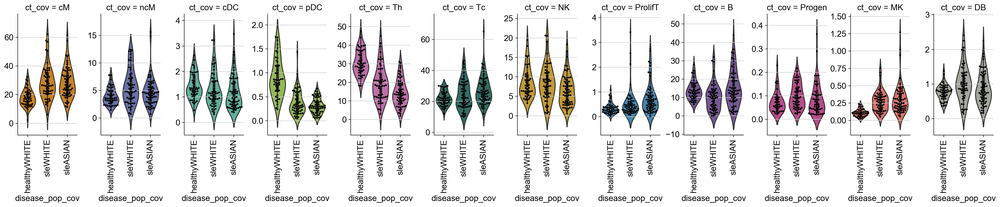

In [20]:
ind_perc['disease_pop_cov'] = pd.Categorical(ind_perc.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)
perc_plot = sns.catplot(x='disease_pop_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', aspect=0.5, height=4, 
                        dodge=False, sharex=False, sharey=False, palette=adata.uns['ct_cov_colors'])
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_pop_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])
    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)


perc_plot.savefig(figdir+"/violin.ct_cov_pop.png")

## Cell proportion analysis of replicated healthy individuals at UCSF

In [21]:
adata_obs_small = adata.obs[(adata.obs.batch_cov.str.contains("lupus"))& (adata.obs.ind_cov.str.contains("IGTB"))]

ind_count2 = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov',"batch_cov"])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ind_count2_sums = ind_count2.groupby(["ind_cov","batch_cov"]).sum()
ind_count2_sums = ind_count2_sums.reset_index(name="pbmc_counts")

##ind_count2_sums = ind_count2.groupby(level=[0]).sum()
##ind_count2_sums = ind_count2_sums.reset_index(name="counts")

ind_perc2 = ind_count2/ind_count2.groupby(["ind_cov","batch_cov"]).transform(sum)*100
##ind_perc2 = ind_count2/ind_count2_sums*100
ind_perc2 = ind_perc2.reset_index(name="ct_perc")
ind_perc2['disease_pop_cov'] = pd.Categorical(ind_perc2.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)

cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'ProlifT', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'cdc','pdc', 'mk', 'progen']})
ind_perc2.ind_cov = ind_perc2.ind_cov.apply(lambda x: x.split('_')[0])
ind_count2_sums.ind_cov = ind_count2_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc2 = ind_perc2.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc2.ind_cov = ind_perc2.ind_cov.astype("str")
##ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc2.reset_index(inplace=True)
ind_perc2.ct_cov = ind_perc2.ct_cov.astype('category')
ind_perc2.ct_cov = ind_perc2.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

ind_perc_all_healthy = ind_perc[ind_perc.disease_cov=="healthy"].append(ind_perc2)
ind_perc_all_healthy_pivot = ind_perc_all_healthy.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")

ind_perc2_pivot = ind_perc2.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")
ind_perc2_pivot_cg_cov = ind_perc2.pivot_table(index=["cg_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")
## filter samples that have < 100 cells
##ind_perc2 = ind_perc2[ind_perc2.ind_cov.isin(ind_count2_sums.ind_cov[ind_count2_sums.counts > 100])]

# g = sns.FacetGrid(ind_perc2, col="ct_cov",  hue="ct_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
# g = g.map(plt.scatter, "", "ct_percs", edgecolor="w")
# g.fig.subplots_adjust(wspace=0.2)
# g.savefig(figdir+"/ifn.ct_cov.png")

/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:6201: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  sort=sort)


In [22]:
# ind_perc2_pivot_cor = ind_perc2_pivot.corr()
# ##np.fill_diagonal(ind_perc2_pivot_cor.values,np.nan)
# ind_perc2_pivot_cor_norm=(ind_perc2_pivot_cor-ind_perc2_pivot_cor.mean())/ind_perc2_pivot_cor.std()

# fig, ax = plt.subplots(figsize=(15,15))
# ax = sns.heatmap(ind_perc2_pivot_cor_norm)

### looking at the UCSF samples with themselves

In [23]:
ind_perc2_ucsf_duplicated = ind_perc2[ind_perc2.duplicated(["ct_cov","ind_cov"], keep=False)]

ind_perc2_ucsf_rep1 = ind_perc2_ucsf_duplicated[ind_perc2_ucsf_duplicated.duplicated(["ct_cov","ind_cov"], keep="first")]
ind_perc2_ucsf_rep2 = ind_perc2_ucsf_duplicated[ind_perc2_ucsf_duplicated.duplicated(["ct_cov","ind_cov"], keep="last")]

ind_perc2_ucsf_rep1_pivot = ind_perc2_ucsf_rep1.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")
ind_perc2_ucsf_rep1_cg_cov = ind_perc2_ucsf_rep1.groupby(["ind_cov","batch_cov","cg_cov"])["ct_perc"].sum()
ind_perc2_ucsf_rep1_cg_cov = ind_perc2_ucsf_rep1_cg_cov.reset_index(name="cg_perc")
ind_perc2_ucsf_rep1_cg_cov_pivot = ind_perc2_ucsf_rep1_cg_cov.pivot_table(index=["cg_cov"], columns=["ind_cov","batch_cov"], values="cg_perc")

ind_perc2_ucsf_rep2_pivot = ind_perc2_ucsf_rep2.pivot_table(index=["ct_cov"], columns=["ind_cov","batch_cov"], values="ct_perc")
ind_perc2_ucsf_rep2_cg_cov = ind_perc2_ucsf_rep2.groupby(["ind_cov","batch_cov","cg_cov"])["ct_perc"].sum()
ind_perc2_ucsf_rep2_cg_cov = ind_perc2_ucsf_rep2_cg_cov.reset_index(name="cg_perc")
ind_perc2_ucsf_rep2_cg_cov_pivot = ind_perc2_ucsf_rep2_cg_cov.pivot_table(index=["cg_cov"], columns=["ind_cov","batch_cov"], values="cg_perc")

print(ind_perc2_ucsf_rep1.shape)
print(ind_perc2_ucsf_rep2.shape)

(203, 8)
(203, 8)


cM         0.783122
ncM        0.836556
cDC        0.397317
pDC        0.610807
Th         0.726847
Tc         0.845401
NK         0.582876
ProlifT    0.500548
B          0.897505
Progen          NaN
dtype: float64


0.6867753926729512

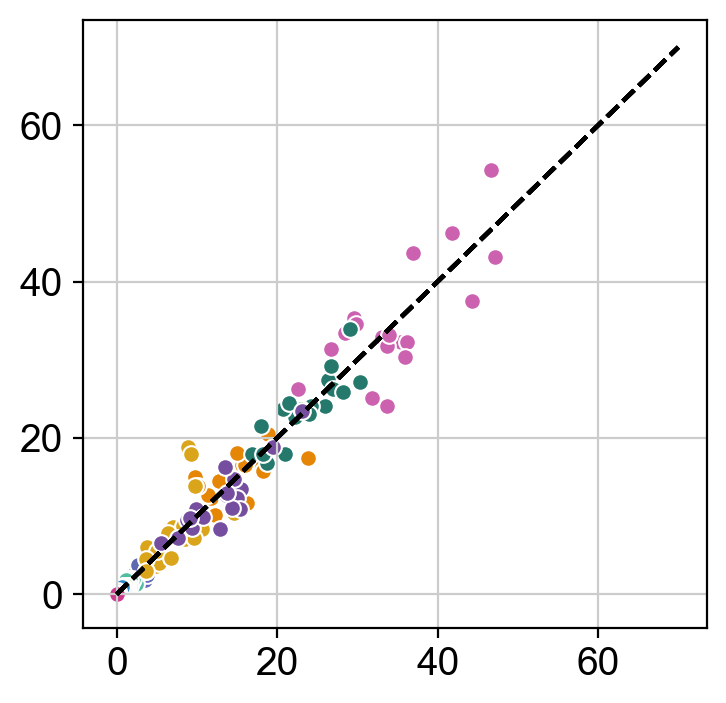

In [24]:
cors = pd.Series()
for ct_i in range(0,10) : 
    ct = ['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B','Progen'][ct_i]
    ax = sns.scatterplot(ind_perc2_ucsf_rep1_pivot.loc[ct].values, ind_perc2_ucsf_rep2_pivot.loc[ct].values, color=adata.uns['ct_cov_colors'][ct_i])
    cors[ct] = np.corrcoef(ind_perc2_ucsf_rep1_pivot.loc[ct].values,ind_perc2_ucsf_rep2_pivot.loc[ct].values)[0,1]
    ax.plot([0,70], [0,70], '--', color='#000000')
print(cors)
cors.mean()

mono      0.816500
mk             NaN
cdc       0.397317
pdc       0.610807
lymph     0.832027
progen         NaN
dtype: float64


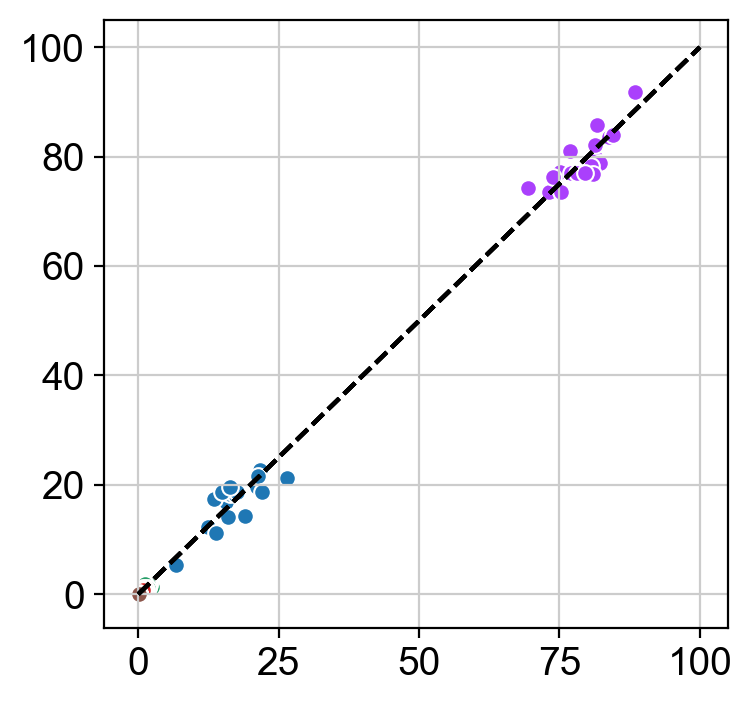

In [25]:
cors = pd.Series()
for ct in ["mono","mk","cdc","pdc","lymph","progen"] :
    ax=sns.scatterplot(ind_perc2_ucsf_rep1_cg_cov_pivot.loc[ct].values, ind_perc2_ucsf_rep2_cg_cov_pivot.loc[ct].values)
    cors[ct] = np.corrcoef(ind_perc2_ucsf_rep1_cg_cov_pivot.loc[ct].values,ind_perc2_ucsf_rep2_cg_cov_pivot.loc[ct].values)[0,1]
    ax.plot([0,100], [0,100], '--', color='#000000')
print(cors)

cM         0.204328
ncM       -0.112767
cDC       -0.011179
pDC        0.287447
Th         0.040175
Tc        -0.107740
NK        -0.111629
ProlifT   -0.361120
B          0.513603
Progen          NaN
dtype: float64


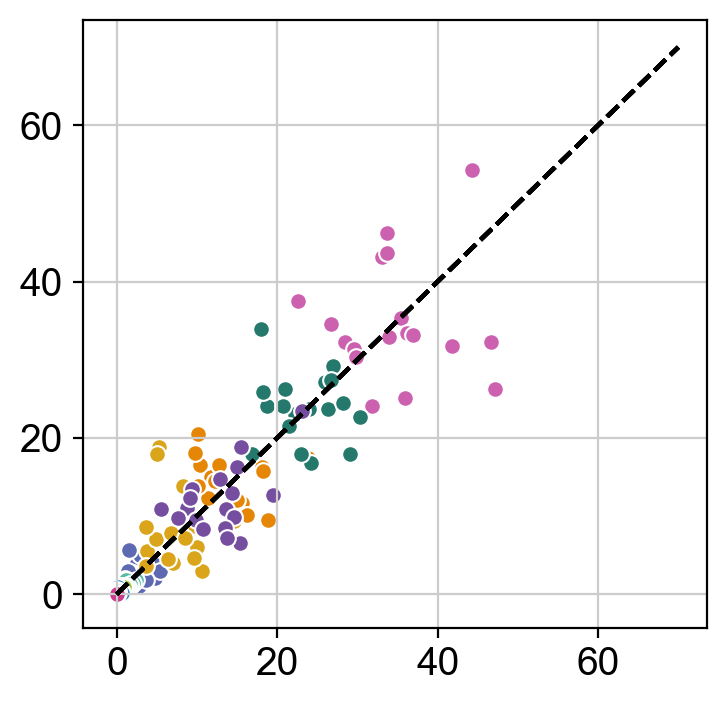

In [26]:
cors = pd.Series()
for ct_i in range(0,10) : 
    ct = ['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B','Progen'][ct_i]
    shuffled = shuffle(ind_perc2_ucsf_rep2_pivot.loc[ct].values);
    ax = sns.scatterplot(ind_perc2_ucsf_rep1_pivot.loc[ct].values, shuffled, color=adata.uns['ct_cov_colors'][ct_i])
    cors[ct] = np.corrcoef(ind_perc2_ucsf_rep1_pivot.loc[ct].values, shuffled)[0,1]
    ax.plot([0,70], [0,70], '--', color='#000000')
print(cors)

mono     -0.203166
mk             NaN
cdc       0.038521
pdc      -0.015353
lymph     0.346142
progen         NaN
dtype: float64


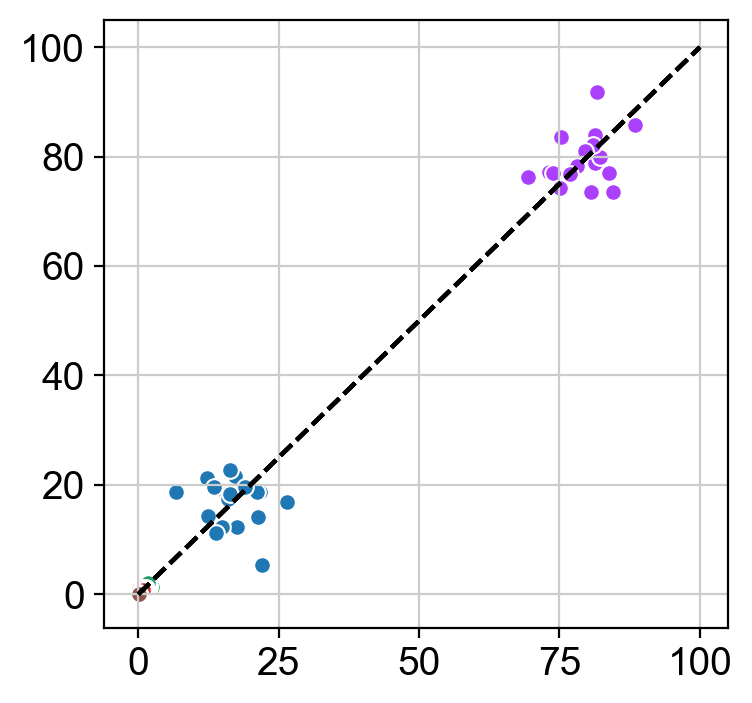

In [27]:
cors = pd.Series()
for ct in ["mono","mk","cdc","pdc","lymph","progen"] :
    shuffled = shuffle(ind_perc2_ucsf_rep2_cg_cov_pivot.loc[ct].values);
    ax = sns.scatterplot(ind_perc2_ucsf_rep1_cg_cov_pivot.loc[ct].values, shuffled)
    cors[ct] = np.corrcoef(ind_perc2_ucsf_rep1_cg_cov_pivot.loc[ct].values, shuffled)[0,1]
    ax.plot([0,100], [0,100], '--', color='#000000')
print(cors)

### looking at UCSF samples with Broad

In [28]:
ind_perc2_sorted = ind_perc2.sort_values(by=["ind_cov","batch_cov"],ascending=True)
ind_perc_all = ind_perc[ind_perc.disease_cov=="healthy"].append(ind_perc2_sorted[~ind_perc2_sorted.duplicated(["ct_cov","ind_cov"], keep="first")])

ind_perc_all_duplicated = ind_perc_all[ind_perc_all.duplicated(["ct_cov","ind_cov"], keep=False)]

ind_perc_all_rep1 = ind_perc_all_duplicated[ind_perc_all_duplicated.duplicated(["ct_cov","ind_cov"], keep="first")]
ind_perc_all_rep2 = ind_perc_all_duplicated[ind_perc_all_duplicated.duplicated(["ct_cov","ind_cov"], keep="last")]

ind_perc_all_rep1_pivot = ind_perc_all_rep1.pivot_table(index=["ct_cov"], columns=["ind_cov"], values="ct_perc")
ind_perc_all_rep1_cg_cov = ind_perc_all_rep1.groupby(["ind_cov","cg_cov"])["ct_perc"].sum()
ind_perc_all_rep1_cg_cov = ind_perc_all_rep1_cg_cov.reset_index(name="cg_perc")
ind_perc_all_rep1_cg_cov_pivot = ind_perc_all_rep1_cg_cov.pivot_table(index=["cg_cov"], columns=["ind_cov"], values="cg_perc")

ind_perc_all_rep2_pivot = ind_perc_all_rep2.pivot_table(index=["ct_cov"], columns=["ind_cov"], values="ct_perc")
ind_perc_all_rep2_cg_cov = ind_perc_all_rep2.groupby(["ind_cov","cg_cov"])["ct_perc"].sum()
ind_perc_all_rep2_cg_cov = ind_perc_all_rep2_cg_cov.reset_index(name="cg_perc")
ind_perc_all_rep2_cg_cov_pivot = ind_perc_all_rep2_cg_cov.pivot_table(index=["cg_cov"], columns=["ind_cov"], values="cg_perc")

print(ind_perc_all_rep1.shape)
print(ind_perc_all_rep2.shape)

(221, 9)
(221, 9)


cM         0.846029
ncM        0.883475
cDC        0.704806
pDC        0.461128
Th         0.918420
Tc         0.882741
NK         0.854678
ProlifT    0.835443
B          0.954415
Progen          NaN
dtype: float64


0.8156818792834231

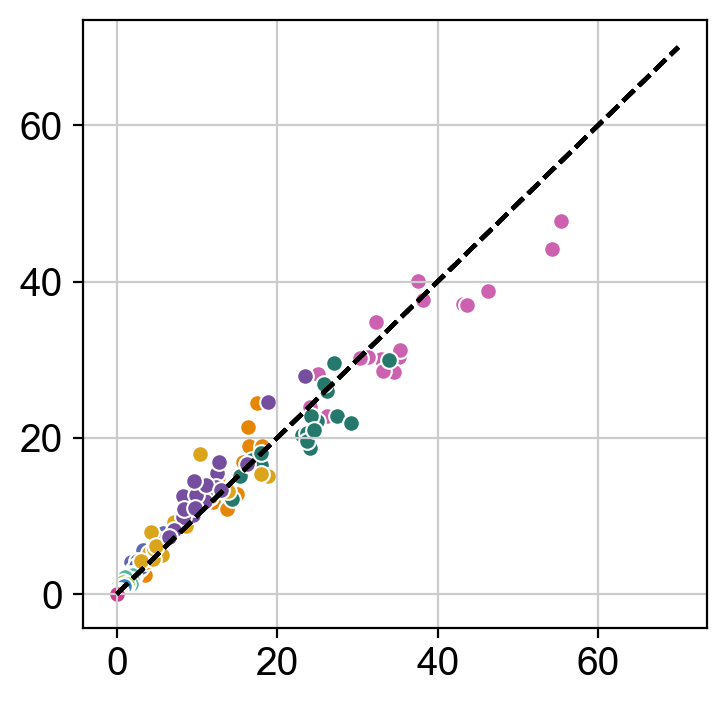

In [29]:
cors = pd.Series()
for ct_i in range(0,10) : 
    ct = ['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B','Progen'][ct_i]
    ax = sns.scatterplot(ind_perc_all_rep1_pivot.loc[ct].values, ind_perc_all_rep2_pivot.loc[ct].values,  color=adata.uns['ct_cov_colors'][ct_i])
    cors[ct] = np.corrcoef(ind_perc_all_rep1_pivot.loc[ct].values, ind_perc_all_rep2_pivot.loc[ct].values)[0,1]
    ax.plot([0,70], [0,70], '--', color='#000000')
print(cors)
cors.mean()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.6/site-packages/pandas/core/generic.py:7620: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)
/anaconda3/lib/pyth

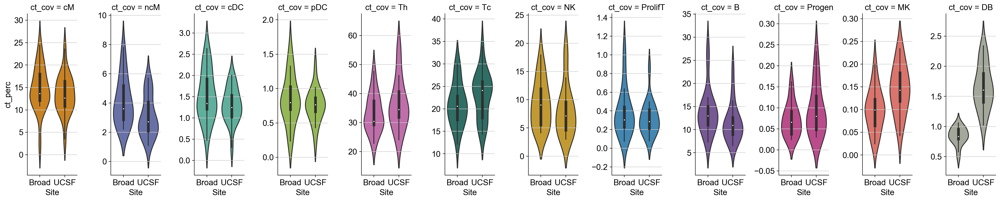

In [30]:
ind_perc_all_duplicated['Site'] = pd.Categorical(pd.Series(['Broad']).repeat(ind_perc_all_duplicated.shape[0]), categories=['Broad','UCSF'],ordered=True)
ind_perc_all_duplicated.Site[ind_perc_all_duplicated.batch_cov.str.contains("immvar")] = "Broad";
ind_perc_all_duplicated.Site[~ind_perc_all_duplicated.batch_cov.str.contains("immvar")] = "UCSF";

blah = sns.catplot(x='Site', y='ct_perc', hue='ct_cov', data=ind_perc_all_duplicated, kind='violin', col='ct_cov', palette=adata.uns['ct_cov_colors'],
                   dodge=False, aspect=0.4, sharex=False, sharey=False)

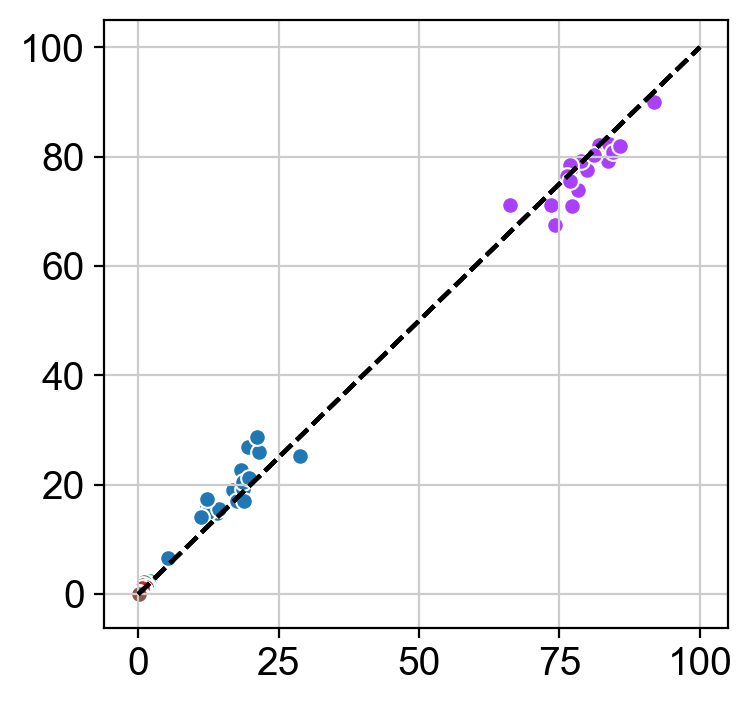

In [31]:
for ct in ["mono","mk","cdc","pdc","lymph","progen"] :
    ax = sns.scatterplot(ind_perc_all_rep1_cg_cov_pivot.loc[ct].values, ind_perc_all_rep2_cg_cov_pivot.loc[ct].values)
    ax.plot([0,100], [0,100], '--', color='#000000')

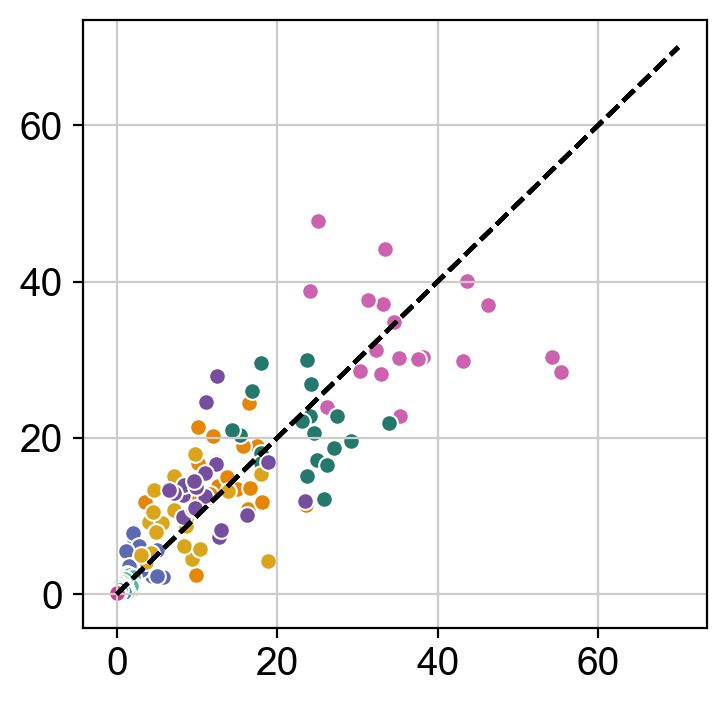

In [32]:
for ct_i in range(0,10) : 
    ct = ['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B','Progen'][ct_i]
    ax = sns.scatterplot(ind_perc_all_rep1_pivot.loc[ct].values, shuffle(ind_perc_all_rep2_pivot.loc[ct].values), color=adata.uns['ct_cov_colors'][ct_i])
    ax.plot([0,70], [0,70], '--', color='#000000')

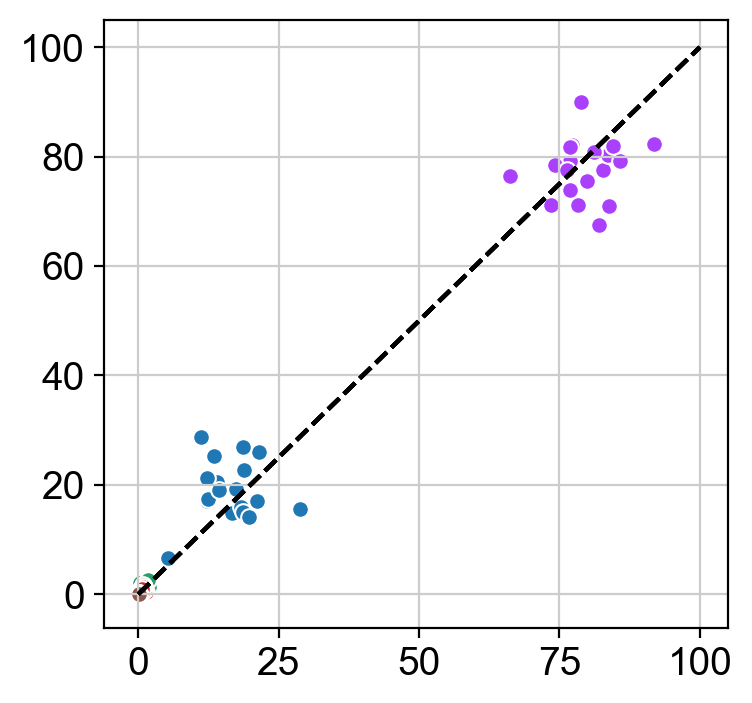

In [33]:
for ct in ["mono","mk","cdc","pdc","lymph","progen"] :
    ax = sns.scatterplot(ind_perc_all_rep1_cg_cov_pivot.loc[ct].values, shuffle(ind_perc_all_rep2_cg_cov_pivot.loc[ct].values))
    ax.plot([0,100], [0,100], '--', color='#000000')

## Cell proportion analysis using only the UCSF multiplexed samples

### here, we are going to use only one of the two replicates for analyses

In [34]:
## Make proportion plots (Fig. 1D)

adata_obs_small = adata.obs[(adata.obs.batch_cov.str.contains("lupus"))]

## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

ind_count_sums = ind_count.groupby(["ind_cov","batch_cov"]).sum()
ind_count_sums = ind_count_sums.reset_index(name="pbmc_counts")

ind_perc = ind_count/ind_count.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov.isin(ind_count_sums.ind_cov[ind_count_sums.pbmc_counts > 100])]


In [35]:
## for now, let's filter out one of the reps for the healthies
ind_perc = ind_perc.drop_duplicates(subset=['ct_cov','ind_cov'])
ind_count_sums = ind_count_sums.drop_duplicates(subset=['ind_cov'])

In [36]:
cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'ProlifT', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'cdc','pdc', 'mk', 'progen']})
ind_perc.ind_cov = ind_perc.ind_cov.apply(lambda x: x.split('_')[0])
ind_count_sums.ind_cov = ind_count_sums.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc = ind_perc.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc.ind_cov = ind_perc.ind_cov.astype("str")
ind_perc.batch_cov = ind_perc.batch_cov.astype("str")
ind_perc.reset_index(inplace=True)
ind_perc.ct_cov = ind_perc.ct_cov.astype('category')
ind_perc.ct_cov = ind_perc.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)

print('as a proportion of total PBMC ')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
print('\nwhite sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.pop_cov=="WHITE"].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[ind_perc.pop_cov=="WHITE"].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
print('\nasian sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))].disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
    
print('\nwhite sle vs asian sle')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc[ind_perc.disease_cov=="sle"].ct_perc[ind_perc.ct_cov==ct]
    pop = ind_perc[ind_perc.disease_cov=="sle"].pop_cov[ind_perc.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), pop.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    print('Beta='+str(effect)+', pvalue='+str(pval))

as a proportion of total PBMC 
Cell type:cM
Beta=-14.661992312263397, pvalue=9.748541021591228e-09
Cell type:ncM
Beta=-2.140299099015657, pvalue=0.0009192197289414825
Cell type:cDC
Beta=0.1533928966209554, pvalue=0.3036975023662763
Cell type:pDC
Beta=0.44768000570185773, pvalue=3.2825294261077783e-15
Cell type:Th
Beta=19.354960160053928, pvalue=2.1715592326169434e-17
Cell type:Tc
Beta=-2.808033244621324, pvalue=0.16469506086229035
Cell type:NK
Beta=0.5764623781482274, pvalue=0.5688524996750688
Cell type:ProlifT
Beta=-0.3413447839332065, pvalue=0.01033033568277111
Cell type:B
Beta=-1.1267688192094538, pvalue=0.5674260086009781
Cell type:Progen
Beta=-0.0043346703063174685, pvalue=0.7773035369193804
Cell type:MK
Beta=-0.1578037276466592, pvalue=0.000285393380302833

white sle vs white healthy
Cell type:cM
Beta=-14.602251746682803, pvalue=2.1841995069021255e-07
Cell type:ncM
Beta=-2.677781610873219, pvalue=0.0002333688274018998
Cell type:cDC
Beta=0.0988642665411587, pvalue=0.53156935775420

## Next, let's plot the proportions

In [37]:
# perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False)

# for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
#     ct = ind_perc.ct_cov.cat.categories[ct_i]
#     sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])

# perc_plot.savefig(figdir+"/violin.ct_cov.png")
# #fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
# #fig.tight_layout()

# ##for ct_i in list(range(10)) :
# ##    ct = ind_perc.ct_cov.cat.categories[ct_i]
# ##    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
# ##    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

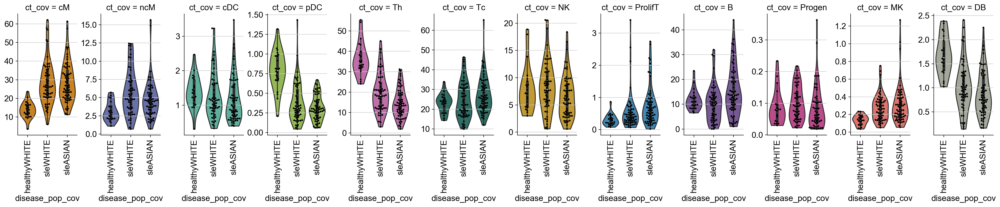

In [38]:
ind_perc['disease_pop_cov'] = pd.Categorical(ind_perc.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)
perc_plot = sns.catplot(x='disease_pop_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', aspect=0.5, height=4, 
                        dodge=False, sharex=False, sharey=False, cut=0,palette=adata.uns['ct_cov_colors'])
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    sns.swarmplot(x="disease_pop_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])
    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)


perc_plot.savefig(figdir+"/violin.ct_cov_pop.png")

## Cell proportion analysis using all ImmVar samples

In [39]:
## Make proportion plots (Fig. 1D)

##adata_obs_small = adata.obs[(adata.obs.study_cov=="ImmVar") & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & (adata.obs.study_cov=="CLUES"))]
##adata_obs_small = adata.obs[(adata.obs.well.str.contains("immvar")) & (adata.obs.ind_cov.str.contains("IGTB")) | (~adata.obs.ind_cov.str.contains("IGTB") & ~adata.obs.well.str.contains("immvar"))]
adata_obs_small = adata.obs;##[(adata.obs.batch_cov.str.contains("lupus"))]

##ind_count = adata_obs_small.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov','batch_cov'])['ct_cov'].count()

## no batch_cov so that we aggregate the count for the two healthy controls
ind_count = adata_obs_small.groupby(['ind_cov','ct_cov','disease_cov','pop_cov','batch_cov','site'])['ct_cov'].count()

##ind_count = adata.obs.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()
##ind_count = adata.obs.groupby(['ind_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()

##ind_count = ind_count.reset_index(name="counts")
ind_count_sums = ind_count.groupby(["ind_cov","batch_cov","disease_cov","pop_cov","site"]).sum()
ind_count_sums = ind_count_sums.reset_index(name="pbmc_counts")

##ind_perc = ind_count/ind_count.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ind_perc = ind_count/ind_count.groupby(["ind_cov","batch_cov"]).transform(sum)*100
ind_perc = ind_perc.reset_index(name="ct_perc")

# Add weights to WLS
ind_perc['ct_counts'] = ind_count.values.tolist()

## filter samples that have < 100 cells
ind_perc = ind_perc[ind_perc.ind_cov.isin(ind_count_sums.ind_cov[ind_count_sums.pbmc_counts > 100])]
ind_count_sums = ind_count_sums[ind_count_sums.pbmc_counts > 100];

In [40]:
print("ind_perc.shape: ",ind_perc.shape)
print("ind_count_sums.shape: ", ind_count_sums.shape)
print("len(ind_perc.ind_cov): ", len(ind_perc.ind_cov))
print("len(ind_perc.ind_cov.unique): ", len(ind_perc.ind_cov.unique()))

## for now, let's filter out one of the reps for the healthies from UCSF only
## and filter out any broad samples that were replicated at UCSF
ind_perc_broad = ind_perc[~ind_perc.batch_cov.str.contains("lupus")]
ind_perc_ucsf = ind_perc[ind_perc.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ct_cov','ind_cov'])
ind_perc_all = ind_perc_ucsf.append(ind_perc_broad);

ind_count_sums_broad = ind_count_sums[~ind_count_sums.batch_cov.str.contains("lupus")]
ind_count_sums_ucsf = ind_count_sums[ind_count_sums.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ind_cov'])
ind_count_sums_all = ind_count_sums_ucsf.append(ind_count_sums_broad);

print(ind_perc.shape)
print(ind_count_sums.shape)

##ind_count = ind_count.drop_duplicates(subset=['ct_cov','ind_cov'])

ind_perc.shape:  (2421, 8)
ind_count_sums.shape:  (206, 6)
len(ind_perc.ind_cov):  2421
len(ind_perc.ind_cov.unique):  169
(2421, 8)
(206, 6)


In [41]:
cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'ProlifT', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'dc','dc', 'mk', 'progen']})
ind_perc_all.ind_cov = ind_perc_all.ind_cov.apply(lambda x: x.split('_')[0])
ind_count_sums_all.ind_cov = ind_count_sums_all.ind_cov.apply(lambda x: x.split('_')[0])
ind_perc_all = ind_perc_all.set_index('ct_cov').join(cg_cov.set_index('ct_cov'))
ind_perc_all.ind_cov = ind_perc_all.ind_cov.astype("str")
ind_perc_all.batch_cov = ind_perc_all.batch_cov.astype("str")
ind_perc_all.reset_index(inplace=True)
ind_perc_all.ct_cov = ind_perc_all.ct_cov.astype('category')
ind_perc_all.ct_cov = ind_perc_all.ct_cov.cat.reorder_categories(adata.obs.ct_cov.cat.categories.values)
## do this to get monos and lympho to have similar colors as the major cell types
ind_perc_all.cg_cov = ind_perc_all.cg_cov.astype('category')
ind_perc_all.cg_cov = ind_perc_all.cg_cov.cat.reorder_categories(["mono", "dc", "mk", "progen","lymph"])

ind_perc = ind_perc_all.drop_duplicates(subset=['ct_cov','ind_cov']);
ind_count_sums = ind_count_sums_all.drop_duplicates(subset=['ind_cov']);

print('as a proportion of total PBMC ')

all_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(all_out) 
##print(all_out)

print('\nwhite sle vs white healthy')

white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ind_perc_small = ind_perc[ind_perc.pop_cov=="WHITE"];
    ct_perc = ind_perc_small.ct_perc[ind_perc_small.ct_cov==ct]
    disease = ind_perc_small.disease_cov[ind_perc_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    white_out = white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(white_out)  
##print(white_out)

print('\nasian sle vs white healthy')

asian_sle_white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ind_perc_small = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))]
    ct_perc = ind_perc_small.ct_perc[ind_perc_small.ct_cov==ct]
    disease = ind_perc_small.disease_cov[ind_perc_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_sle_white_out = asian_sle_white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_sle_white_out); ##print(white_out)    
     
print('\nwhite sle vs asian sle')

asian_white_sle_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ind_perc_small = ind_perc[ind_perc.disease_cov=="sle"];
    ct_perc = ind_perc_small.ct_perc[ind_perc.ct_cov==ct]
    pop = ind_perc_small.pop_cov[ind_perc.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), pop.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_white_sle_out = asian_white_sle_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_white_sle_out); ##print(white_out)    

as a proportion of total PBMC 


,Beta,Cell,Pval
0,-11.27700571876232,cM,1.9320204420698433e-10
1,-1.7325704486789353,ncM,9.090489279215713e-05
2,0.12863753324479782,cDC,0.21110719498504593
3,0.5268892866784983,pDC,1.4249193650055864e-23
4,15.383085393208976,Th,6.5867080106315654e-21
5,-3.1559314277135657,Tc,0.02203538720905361
6,0.5505191282665924,NK,0.441145446814565
7,-0.3429413959741494,ProlifT,0.00013621368323832604
8,-0.07283356640723915,B,0.9569477294186945
9,-0.011094732145807579,Progen,0.31542224931084634



white sle vs white healthy


,Beta,Cell,Pval
0,-11.217265153181742,cM,1.6913204388627653e-08
1,-2.2700529605365,ncM,8.246268034615972e-06
2,0.07410890316500071,cDC,0.5096535689006849
3,0.4929793089881629,pDC,9.35826408962991e-13
4,12.656087425245298,Th,3.868450310218159e-11
5,-1.5561105858177848,Tc,0.2830986700835262
6,-0.4241045164840078,NK,0.6151486939054833
7,-0.2295603662706493,ProlifT,0.008609779749772903
8,2.5635398140011456,B,0.03651594650206141
9,-0.018604392408078582,Progen,0.09818998396765063



asian sle vs white healthy


,Beta,Cell,Pval
0,-11.330108443722828,cM,7.393388576040987e-10
1,-1.2548082159166534,ncM,0.0029023831511797576
2,0.17710742664906237,cDC,0.10418138329343793
3,0.5575176536246073,pDC,4.182692095282919e-19
4,17.807083586954484,Th,7.492663052260268e-23
5,-4.577994398287592,Tc,0.0013293369648850449
6,1.4168512569337957,NK,0.057752038951019026
7,-0.4437245334883717,ProlifT,3.1742414655706173e-06
8,-2.4162765712146896,B,0.10966419464019286
9,-0.003873904970547001,Progen,0.7677399368800548



white sle vs asian sle


,Beta,Cell,Pval
0,-0.11284329054107836,cM,0.9560930706967699
1,1.0152447446198487,ncM,0.05660346245722444
2,0.10299852348406191,cDC,0.4029511210308816
3,0.06453834463644453,pDC,0.09763413436984711
4,5.150996161709188,Th,0.0009440165911115553
5,-3.021883812469797,Tc,0.07314299960967291
6,1.8409557734178057,NK,0.02090695699894659
7,-0.21416416721772225,ProlifT,0.05534651490539884
8,-4.979816385215837,B,0.0023593102548782057
9,0.014730487437531617,Progen,0.23277746027709606


## weight OLS

In [42]:
print('as a proportion of total PBMC ')

all_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_perc.ct_counts[ind_perc.ct_cov==ct]
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)    
display(all_out)
all_out.to_csv('all_out_ct_counts.txt')

print('\nwhite sle vs white healthy')

white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ind_perc_small = ind_perc[ind_perc.pop_cov=="WHITE"];
    ct_perc = ind_perc_small.ct_perc[ind_perc_small.ct_cov==ct]
    disease = ind_perc_small.disease_cov[ind_perc_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_perc_small.ct_counts[ind_perc_small.ct_cov==ct]
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    white_out = white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(white_out); ##print(white_out)

asian_sle_white_out = pd.DataFrame();

print('\nasian sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ind_perc_small = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))]
    ct_perc = ind_perc_small.ct_perc[ind_perc_small.ct_cov==ct]
    disease = ind_perc_small.disease_cov[ind_perc_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_perc_small.ct_counts[ind_perc_small.ct_cov==ct]
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_sle_white_out = asian_sle_white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_sle_white_out); ##print(white_out)    
    
print('\nwhite sle vs asian sle')

asian_white_sle_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ind_perc_small = ind_perc[ind_perc.disease_cov=="sle"];
    ct_perc = ind_perc_small.ct_perc[ind_perc.ct_cov==ct]
    pop = ind_perc_small.pop_cov[ind_perc.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    weights = ind_perc_small.ct_counts[ind_perc_small.ct_cov==ct]
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), pop.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_white_sle_out = asian_white_sle_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_white_sle_out); ##print(white_out)    
    

as a proportion of total PBMC 


,Beta,Cell,Pval
0,-13.198265020273158,cM,7.282480360894861e-08
1,-2.7230629389929897,ncM,4.023741337733754e-05
2,-0.07776577208041749,cDC,0.5235640490207027
3,0.5713771610194376,pDC,2.38997561402824e-22
4,13.057249454367792,Th,2.6600608958014715e-16
5,-5.583612604220552,Tc,0.0009900981477562502
6,-0.5838740195277545,NK,0.45126285994902926
7,-0.792260942225655,ProlifT,4.954958408876438e-05
8,-4.993569243313441,B,0.0023601776989892707
9,-0.012335037249740236,Progen,0.3950029887210823



white sle vs white healthy


,Beta,Cell,Pval
0,-13.401534515827688,cM,8.76257396351149e-08
1,-3.33875260760269,ncM,2.1743726040033774e-07
2,-0.13110932734344075,cDC,0.30809141765986836
3,0.49822237484854115,pDC,7.466802112883862e-10
4,9.92627950570024,Th,2.9353609024250693e-07
5,-4.22500481793872,Tc,0.009598952860570166
6,-1.4314594931596187,NK,0.10403482949919451
7,-0.7185393488292737,ProlifT,0.00023431367534814776
8,-0.8880083986852592,B,0.49954507136726134
9,-0.008882564263423659,Progen,0.4813699652756518



asian sle vs white healthy


,Beta,Cell,Pval
0,-13.027945208622025,cM,6.274479826618089e-08
1,-2.096955429730758,ncM,0.001404732797302563
2,-0.028415047919136793,cDC,0.8210754290901081
3,0.6462695905673153,pDC,1.3579376412749688e-17
4,16.752766772030867,Th,3.308315723623544e-19
5,-6.601628007702621,Tc,0.00018336127122093592
6,0.3185407620124825,NK,0.6911387579705004
7,-0.8363308137934269,ProlifT,3.6879985698883854e-06
8,-7.26057122439314,B,7.422022368703153e-05
9,-0.01613829626140454,Progen,0.365474352278068



white sle vs asian sle


,Beta,Cell,Pval
0,0.3735893072056591,cM,0.8680613984516856
1,1.2417971778719312,ncM,0.051660995815176906
2,0.10269427942430395,cDC,0.4682202956761985
3,0.14804721571877383,pDC,0.0018626891995933747
4,6.826487266330634,Th,3.1652594930350265e-05
5,-2.3766231897638956,Tc,0.194621852511277
6,1.7500002551721052,NK,0.030349573757888212
7,-0.11779146496415277,ProlifT,0.48770231147407295
8,-6.372562825707867,B,0.0006738193128836361
9,-0.007255731997980866,Progen,0.6181734826406322


## weight OLS by total number of cells per sample

In [43]:
print('as a proportion of total PBMC ')

all_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ##print(ct);
    ct_perc = ind_perc.ct_perc[ind_perc.ct_cov==ct]
    disease = ind_perc.disease_cov[ind_perc.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_count_sums[ind_count_sums.ind_cov.isin(ind_perc.ind_cov[ind_perc.ct_cov==ct])].pbmc_counts;
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    all_out = all_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)    
display(all_out)
all_out.to_csv('all_out_pbmc_counts.txt')

print('\nwhite sle vs white healthy')

white_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ind_perc_small = ind_perc[ind_perc.pop_cov=="WHITE"];
    ct_perc = ind_perc_small.ct_perc[ind_perc_small.ct_cov==ct]
    disease = ind_perc_small.disease_cov[ind_perc_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_count_sums[ind_count_sums.ind_cov.isin(ind_perc_small.ind_cov[ind_perc_small.ct_cov==ct])].pbmc_counts;
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    white_out = white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(white_out); ##print(white_out)

asian_sle_white_out = pd.DataFrame();

print('\nasian sle vs white healthy')

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ind_perc_small = ind_perc[((ind_perc.pop_cov=="WHITE") & (ind_perc.disease_cov=="healthy")) | ((ind_perc.pop_cov=="ASIAN") & (ind_perc.disease_cov=="sle"))]
    ct_perc = ind_perc_small.ct_perc[ind_perc_small.ct_cov==ct]
    disease = ind_perc_small.disease_cov[ind_perc_small.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    weights = ind_count_sums[ind_count_sums.ind_cov.isin(ind_perc_small.ind_cov[ind_perc_small.ct_cov==ct])].pbmc_counts;
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), disease.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_sle_white_out = asian_sle_white_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_sle_white_out); ##print(white_out)    
    
print('\nwhite sle vs asian sle')

asian_white_sle_out = pd.DataFrame();

for ct_i in list(range(11)) :
    ct = ind_perc.ct_cov.cat.categories[ct_i]
    ind_perc_small = ind_perc[ind_perc.disease_cov=="sle"];
    ct_perc = ind_perc_small.ct_perc[ind_perc.ct_cov==ct]
    pop = ind_perc_small.pop_cov[ind_perc.ct_cov==ct]
    pop = pop.astype("str")
    pop.values[pop=="ASIAN"] = 0
    pop.values[pop=="WHITE"] = 1
    pop = sm.add_constant(pop)
    weights = ind_count_sums[ind_count_sums.ind_cov.isin(ind_perc_small.ind_cov[ind_perc_small.ct_cov==ct])].pbmc_counts;
     ##data = data.assign(ct_perc=ct_perc)
    ##print('Cell type:'+ ct)
    est=sm.WLS(ct_perc.astype(float), pop.astype(float), weights=weights)
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    #print(effect)
    #print(pval)
    asian_white_sle_out = asian_white_sle_out.append(({"Cell":str(ct),"Beta":str(effect),"Pval":str(pval)}), ignore_index=True)
display(asian_white_sle_out); ##print(white_out)    
    

as a proportion of total PBMC 


,Beta,Cell,Pval
0,-10.741421310745048,cM,1.684609656529884e-08
1,-1.6742194009077185,ncM,0.000531667217240205
2,0.13125795717366492,cDC,0.23755755261300698
3,0.5457223411567755,pDC,5.15573064875286e-24
4,15.33315468463919,Th,8.629805125976844e-19
5,-3.3227504909453365,Tc,0.025482586130388434
6,0.3014028252276574,NK,0.6799076265990384
7,-0.33624304888249434,ProlifT,0.00042934875739662943
8,-0.1872977778483561,B,0.898943543571789
9,-0.00949716664002322,Progen,0.4150558006504169



white sle vs white healthy


,Beta,Cell,Pval
0,-10.63438381170086,cM,1.7272658681208756e-07
1,-2.2052111001131847,ncM,3.8397067398958314e-05
2,0.07024760962761441,cDC,0.5497942981012138
3,0.5129829392574179,pDC,1.2682486051594438e-13
4,12.240575421301656,Th,4.4226692514305915e-10
5,-1.6646727331179867,Tc,0.27395232778233164
6,-0.628735539414996,NK,0.43625028404595334
7,-0.2213704818398387,ProlifT,0.012459770420686272
8,2.6710852877664895,B,0.03281165217910601
9,-0.018671035552317798,Progen,0.10209562230252255



asian sle vs white healthy


,Beta,Cell,Pval
0,-10.831736106557651,cM,2.784095865824587e-08
1,-1.226185699446419,ncM,0.006684233968872463
2,0.18273652431397786,cDC,0.11212065428807451
3,0.5737787516330446,pDC,2.3737415817428297e-20
4,17.94257350698397,Th,1.3201576170974426e-22
5,-4.7217831241514965,Tc,0.0016108254474805548
6,1.08622363317169,NK,0.1412654753152667
7,-0.4331688228361985,ProlifT,1.5525694815823296e-05
8,-2.5991093880825265,B,0.1089638572240433
9,-0.0011850521689605485,Progen,0.928654541577313



white sle vs asian sle


,Beta,Cell,Pval
0,-0.19735229485678712,cM,0.9239013469495736
1,0.9790254006667667,ncM,0.06935571063338736
2,0.11248891468636364,cDC,0.35906878676743215
3,0.060795812375626646,pDC,0.11192894967805597
4,5.70199808568232,Th,0.0002436873766284529
5,-3.0571103910335102,Tc,0.06792107320987312
6,1.714959172586688,NK,0.027691226331651244
7,-0.21179834099636002,ProlifT,0.05200349575290777
8,-5.270194675849016,B,0.0014030413170777372
9,0.017485983383357204,Progen,0.14351978650060734


## Next, let's plot the proportions

In [44]:
# perc_plot = sns.catplot(x='disease_cov', y='ct_perc', hue='ct_cov', data=ind_perc, kind='violin', col='ct_cov', dodge=False, aspect=0.4, sharex=False, sharey=False)

# for ct_i in list(range(len(ind_perc.ct_cov.cat.categories))) :
#     ct = ind_perc.ct_cov.cat.categories[ct_i]
#     sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=perc_plot.axes[0,ct_i])

# perc_plot.savefig(figdir+"/violin.ct_cov.png")
# #fig,ax = plt.subplots(nrows=1,ncols=10, figsize=(20,5))
# #fig.tight_layout()

# ##for ct_i in list(range(10)) :
# ##    ct = ind_perc.ct_cov.cat.categories[ct_i]
# ##    sns.boxplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
# ##    sns.swarmplot(x="disease_cov", y="ct_perc", data=ind_perc[ind_perc.ct_cov == ct], color="0", size=3, ax=ax[ct_i])

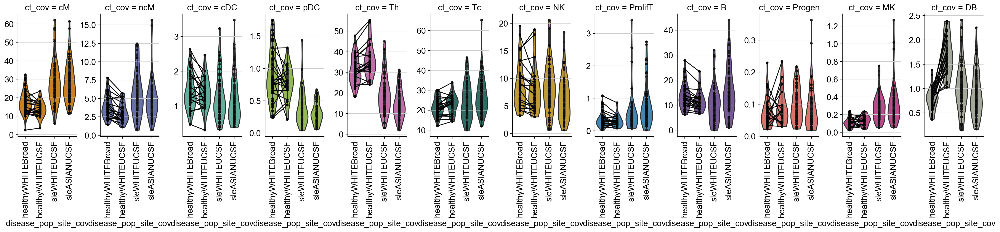

In [45]:
adata.uns['ct_cov_colors'] = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E","#A5AA99"]

ind_perc_all['site'] = pd.Categorical(ind_perc_all.disease_cov, categories=['Broad','UCSF'])
ind_perc_all.site[ind_perc_all.batch_cov.str.contains("immvar")] = "Broad"
ind_perc_all.site[~ind_perc_all.batch_cov.str.contains("immvar")] = "UCSF"

ind_perc_all['disease_pop_cov'] = pd.Categorical(ind_perc_all.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1),
                                             categories=['healthyWHITE','sleWHITE','sleASIAN'],
                                             ordered=True)

ind_perc_all['disease_pop_site_cov'] = pd.Categorical(ind_perc_all.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)
perc_plot = sns.catplot(x='disease_pop_site_cov', y='ct_perc', hue='ct_cov', data=ind_perc_all, kind='violin', col='ct_cov', aspect=0.5, height=4,
                        dodge=False, sharex=False, sharey=False, cut=0, palette=adata.uns['ct_cov_colors'])
perc_plot.set_xticklabels(rotation=90)
perc_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for ct_i in list(range(len(ind_perc_all.ct_cov.cat.categories))) :
    ct = ind_perc_all.ct_cov.cat.categories[ct_i]
    sns.pointplot(x="disease_pop_site_cov", y="ct_perc", hue = "ind_cov", data=ind_perc_all[ind_perc_all.ct_cov == ct], color="0", scale=0.5, ax=perc_plot.axes[0,ct_i], legend=False)

    perc_plot.axes[0,ct_i].get_yaxis().label.set_visible(False)
    perc_plot.axes[0,ct_i].get_legend().remove()
    
perc_plot.savefig(figdir+"/violin.ct_cov_pop_site.png")




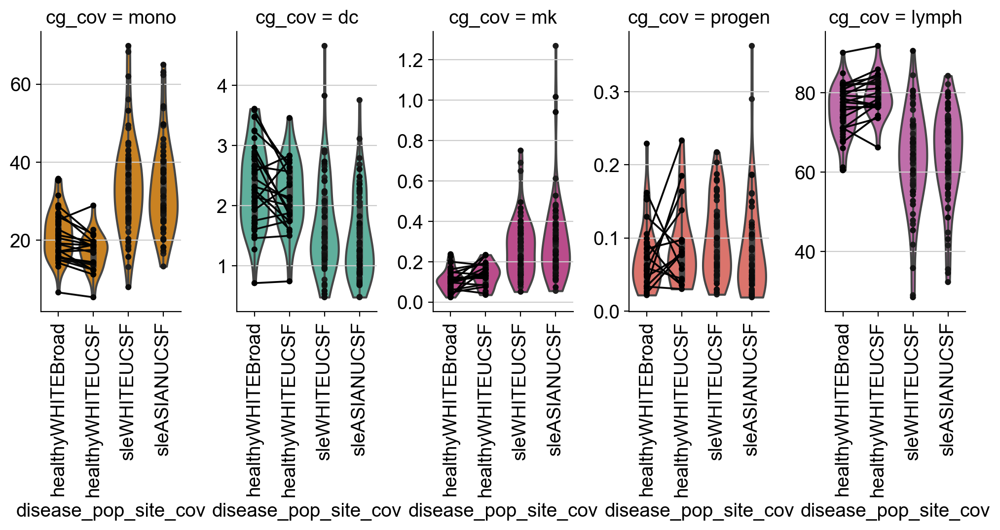

In [46]:
ind_group = ind_perc_all.groupby(['ind_cov','cg_cov','disease_cov','pop_cov','batch_cov','disease_pop_site_cov'])['ct_perc'].sum()
ind_group = ind_group.reset_index(name="cg_perc")
##ind_group.cg_cov = ind_group.cg_cov.astype('category')

group_plot = sns.catplot(x='disease_pop_site_cov', y='cg_perc', hue='cg_cov', data=ind_group, kind='violin', col='cg_cov', aspect=0.55, height=4, 
                        dodge=False, sharex=False, sharey=False, cut=0, palette = ["#E58606","#52BCA3","#CC3A8E","#ED645A","#CC61B0"])##,"#24796C","#DAA51B","#2F8AC4","#764E9F",,"#A5AA99"])
group_plot.set_xticklabels(rotation=90)
group_plot.fig.subplots_adjust(wspace=0.4)
##perc_plot.tight_layout()

for cg_i in list(range(len(ind_group.cg_cov.cat.categories))) :
    cg = ind_group.cg_cov.cat.categories[cg_i]
    ##sns.swarmplot(x="disease_pop_site_cov", y="cg_perc", data=ind_group[ind_group.cg_cov == cg], color="0", size=3, ax=group_plot.axes[0,cg_i])
    sns.pointplot(x="disease_pop_site_cov", y="cg_perc", hue = "ind_cov", data=ind_group[ind_group.cg_cov == cg], color="0", scale=0.5, ax=group_plot.axes[0,cg_i], legend=False)

    group_plot.axes[0,cg_i].get_yaxis().label.set_visible(False)
    group_plot.axes[0,cg_i].get_legend().remove()

group_plot.savefig(figdir+"/violin.cg_cov_pop_site.png")

In [47]:
# ind_group = ind_perc.groupby(['ind_cov','cg_cov','disease_cov','pop_cov','batch_cov','disease_pop_cov'])['ct_perc'].sum()
# ind_group = ind_group.reset_index(name="cg_perc")
# ##ind_group.cg_cov = ind_group.cg_cov.astype('category')

# group_plot = sns.catplot(x='disease_pop_cov', y='cg_perc', hue='cg_cov', data=ind_group, kind='violin', col='cg_cov', aspect=0.55, height=4, 
#                         dodge=False, sharex=False, sharey=False, cut=0)
# group_plot.set_xticklabels(rotation=90)
# group_plot.fig.subplots_adjust(wspace=0.4)
# ##perc_plot.tight_layout()

# for cg_i in list(range(len(ind_group.cg_cov.cat.categories))) :
#     cg = ind_group.cg_cov.cat.categories[cg_i]
#     sns.swarmplot(x="disease_pop_cov", y="cg_perc", data=ind_group[ind_group.cg_cov == cg], color="0", size=3, ax=group_plot.axes[0,cg_i])
#     group_plot.axes[0,cg_i].get_yaxis().label.set_visible(False)

# group_plot.savefig(figdir+"/violin.cg_cov_pop.png")

## leiden proportion analysis

In [48]:

## no batch_cov so that we aggregate the count for the two healthy controls
leiden_count = adata_obs_small.groupby(['ind_cov','leiden','disease_cov','pop_cov','batch_cov','site'])['leiden'].count()

##leiden_count = adata.obs.groupby(['ind_cov','study_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()
##leiden_count = adata.obs.groupby(['ind_cov','ct_cov','disease_cov','pop_cov'])['ct_cov'].count()

##leiden_count = leiden_count.reset_index(name="counts")
leiden_count_sums = leiden_count.groupby(["ind_cov","batch_cov"]).sum()
leiden_count_sums = leiden_count_sums.reset_index(name="leiden_counts")

##leiden_perc = leiden_count/leiden_count.groupby(["ind_cov","batch_cov"]).transform(sum)*100
leiden_perc = leiden_count/leiden_count.groupby(["ind_cov","batch_cov"]).transform(sum)*100
leiden_perc = leiden_perc.reset_index(name="leiden_perc")

## filter samples that have < 100 cells
leiden_perc = leiden_perc[leiden_perc.ind_cov.isin(leiden_count_sums.ind_cov[leiden_count_sums.leiden_counts > 100])]


In [49]:
print(leiden_perc.shape)
print(leiden_count_sums.shape)

## for now, let's filter out one of the reps for the healthies from UCSF only
leiden_perc_broad = leiden_perc[~leiden_perc.batch_cov.str.contains("lupus")]
leiden_perc_ucsf = leiden_perc[leiden_perc.batch_cov.str.contains("lupus")].drop_duplicates(subset=['leiden','ind_cov'])
leiden_perc = leiden_perc_ucsf.append(leiden_perc_broad);

leiden_count_sums_broad = leiden_count_sums[~leiden_count_sums.batch_cov.str.contains("lupus")]
leiden_count_sums_ucsf = leiden_count_sums[leiden_count_sums.batch_cov.str.contains("lupus")].drop_duplicates(subset=['ind_cov'])
leiden_count_sums = leiden_count_sums_ucsf.append(leiden_count_sums_broad);

print(leiden_perc.shape)
print(leiden_count_sums.shape)

##leiden_count = leiden_count.drop_duplicates(subset=['ct_cov','ind_cov'])

(8349, 7)
(206, 3)
(7651, 7)
(188, 3)


In [50]:
leiden_perc.ind_cov = leiden_perc.ind_cov.apply(lambda x: x.split('_')[0])
leiden_count_sums.ind_cov = leiden_count_sums.ind_cov.apply(lambda x: x.split('_')[0])
leiden_perc.ind_cov = leiden_perc.ind_cov.astype("str")
leiden_perc.batch_cov = leiden_perc.batch_cov.astype("str")
leiden_perc.reset_index(inplace=True)
leiden_perc.leiden = leiden_perc.leiden.astype('category')
leiden_perc.leiden = leiden_perc.leiden.cat.reorder_categories(adata.obs.leiden.cat.categories.values)


# Figure 1E: Correlation with EHR

## Some initial data wrangling

ok, there should be 127 lupus patients and 42 immvar donors, we only have estimated PBMC numbers for 11 of them so the final joined table will only have 

In [51]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_csv("v2.clinical.data.txt", index_col=False, sep="\t")
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined = ind_perc.join(ind_count_sums.set_index(['ind_cov','batch_cov','disease_cov','pop_cov','site']), on=['ind_cov','batch_cov','disease_cov','pop_cov','site']);
joined = joined.join(clues_clinical.set_index('genotypeid'), on='ind_cov')
##joined = ind_perc.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_csv("T1labs.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined.AbsBaso = joined.AbsBaso/1000
joined.AbsEosino = joined.AbsEosino/1000
joined.AbsLympho = joined.AbsLympho/1000
joined.AbsNeutro = joined.AbsNeutro/1000
joined.AbsMono = joined.AbsMono/1000

joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

##joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_csv("immvar.pbmc.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))
## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined.pbmc = joined.pbmc.fillna(0)
joined = joined.assign(estimate=joined.ct_perc/100*joined.pbmc)

joined['disease_pop_cov'] = joined.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1)
joined['disease_pop_site_cov'] = pd.Categorical(joined.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)

joined[["ind_cov","disease_cov","ct_cov",'cg_cov',"disease_pop_cov","disease_pop_site_cov"]] = joined[["ind_cov","disease_cov","ct_cov",'cg_cov',"disease_pop_cov","disease_pop_site_cov"]].astype('str')
# joined.plaquenilnow = joined.plaquenilnow.fillna(0)
# joined.cellceptnow = joined.cellceptnow.fillna(0)
# joined.steroralnow = joined.steroralnow.fillna(0)
# joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)
# joined.sledaiscore = joined.sledaiscore.fillna(0)
# joined.WhiteBloodCell = joined.WhiteBloodCell.fillna(0)
# joined.AbsMono = joined.AbsMono.fillna(0)
# joined.AbsLympho = joined.AbsLympho.fillna(0)
# joined.AbsNeutro = joined.AbsNeutro.fillna(0)
# joined.AbsEosino = joined.AbsEosino.fillna(0)
# joined.AbsBaso = joined.AbsBaso.fillna(0)
# joined.PlatCount = joined.PlatCount.fillna(0)
# joined.pbmc = joined.pbmc.fillna(0)
# joined.subjectid = joined.subjectid.fillna(0)
# joined.CreatinineUrine = joined.CreatinineUrine.fillna(0)
# joined.ProteinUrine = joined.CreatinineUrine.fillna(0)
# joined.ProCreatRatio = joined.ProCreatRatio.fillna(0)
# joined.CreatinineSerum = joined.CreatinineSerum.fillna(0)
# joined.antidsDNANum = joined.antidsDNANum.fillna(0)
# joined.C3Num = joined.C3Num.fillna(0)
# joined.ANATiter1 = joined.ANATiter1.fillna(0)
# joined.sledaiantidsdna = joined.sledaiantidsdna.fillna(0)
# joined.sledaileukopenia = joined.sledaileukopenia.fillna(0)
# joined.sledailowcomp = joined.sledailowcomp.fillna(0)
# joined.sledaiproteinuria = joined.sledaiproteinuria.fillna(0)
# joined.sledaipyuria = joined.sledaipyuria.fillna(0)
# joined.acrantismith = joined.acrantismith.fillna(0)
# joined.acrlupneph = joined.acrlupneph.fillna(0)
# joined.sleactivity = joined.sleactivity.fillna(0)

joined.to_csv(name+"_joined.txt")

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [52]:
##indices = ['ind_cov',"disease_cov","disease_pop_cov","disease_pop_site_cov","batch_cov", "pbmc","counts","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia","sledaiscore"];
indices = ['ind_cov',"disease_cov","disease_pop_cov","disease_pop_site_cov","batch_cov", "pbmc","pbmc_counts","plaquenilnow","cellceptnow","steroralnow",
           "acrlymphopenia","sledaiscore",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine',
           'ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1','sledaiseizures', 'sledaipsychosis', 'sledaiobrainsyn',
       'sledaivisdisturb', 'sledaicranialnd', 'sledaisleheadache', 'sledaicva',
       'sledaivasculitis', 'sledaiarthritis', 'sledaimyositis', 'sledairash',
       'sledaialopecia', 'sledaimucosalulcers', 'sledaipleurisy',
       'sledaipericarditis', 'sledaifever', 'sledaiurinarycasts',
       'sledaihematuria', 'sledaiproteinuria', 'sledaipyuria', 'sledailowcomp',
       'sledaiantidsdna', 'sledaithrombocytopenia', 'sledaileukopenia','sledainone','acrantismith','acrlupneph','sleactivity','agedx','sleflare','cancer','kidney'];

for index in indices:
    joined[index] = joined[index].fillna(0)
    
joined.subjectid = joined.subjectid.fillna(0)
##indices = ['ind_cov',"disease_pop_site_cov","disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia","AbsMono","AbsLympho","CreatinineUrine","CreatinineSerum","antidsDNANum","ANATiter1","C3Num","ProCreatRatio","ProteinUrine"]

# ehr_indices = ['subjectid','cg_cov','WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine','ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1']
# ehr_nocg_indices = ['subjectid','WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine','ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1']
# ehr_quantitative_indices = ['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine','ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1']
ehr_indices = ['subjectid','cg_cov'];
ehr_nocg_indices = ['subjectid'];
ehr_quantitative_indices = ['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','CreatinineUrine','ProteinUrine','ProCreatRatio','CreatinineSerum','antidsDNANum','C3Num','ANATiter1']

joined_pivot = joined.pivot_table(index=indices, columns=["ct_cov"], values=["estimate"])
joined_pivot.reset_index(inplace=True)
joined_pivot.to_csv(name+"_joined_pivot_ct_estimates.txt")

## this does not require the pbmc counts
joined_pivot_perc = joined.pivot_table(index=indices, columns="ct_cov", values="ct_perc")
joined_pivot_perc.reset_index(inplace=True)
joined_pivot_perc.to_csv(name+"_joined_pivot_ct_perc.txt")


# ## this does not require the pbmc counts
# joined_pivot_leiden_perc = joined.pivot_table(index=indices, columns="ct_cov", values="leiden")
# joined_pivot_leiden_perc.reset_index(inplace=True)
# joined_pivot_leiden_perc.to_csv(name+"_joined_pivot_ct_perc.txt")


joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

##filter joined
joined = joined[joined.pbmc >= 0]
joined = joined[joined.pbmc < 10]

joined_pivot = joined_pivot[joined_pivot.pbmc >= 0]
joined_pivot = joined_pivot[joined_pivot.pbmc < 10]


##joined_agg = joined.groupby(['ind_cov','subjectid','disease_cov','ct_group','WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc'])['ct_perc'].sum()

##joined_agg = joined.groupby(['ind_cov','subjectid','disease_cov','disease_pop_cov','ct_group','plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","sledaiscore",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc'])['ct_perc'].sum()
joined_agg = joined.groupby(indices+ehr_indices)['ct_perc'].sum()
joined_agg = joined_agg.reset_index(name='cg_perc')

##joined_agg[['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc']] = joined_agg[['WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount','pbmc']].astype(float)
joined_agg[ehr_quantitative_indices]  = joined_agg[ehr_quantitative_indices].astype(float)

joined_agg = joined_agg.assign(estimate=joined_agg.cg_perc/100*joined_agg.pbmc)
joined_agg[["subjectid","disease_cov","cg_cov"]] = joined_agg[["subjectid","disease_cov","cg_cov"]].astype(str)
joined_agg_pivot = joined_agg.pivot_table(index=indices+ehr_nocg_indices, columns="cg_cov", values="estimate")
##joined_agg_pivot = joined_agg.pivot_table(index=['ind_cov', "subjectid", "pbmc","disease_cov","disease_pop_cov","disease_pop_site_cov","batch_cov",'plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","sledaiscore","WhiteBloodCell","AbsMono",'AbsBaso',"AbsLympho","AbsNeutro","AbsEosino","PlatCount"], columns="cg_cov", values="estimate")
joined_agg_pivot.reset_index(inplace=True);

joined_agg[ehr_quantitative_indices] = joined_agg[ehr_quantitative_indices].astype(float);
joined_agg_pivot[ehr_quantitative_indices] = joined_agg_pivot[ehr_quantitative_indices].astype(float)

##joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
##joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)

joined_agg_pivot.to_csv(name+"_joined_pivot_cg_estimates.txt")

##joined_agg_pivot_perc = joined_agg.pivot_table(index=['ind_cov', "subjectid", "pbmc","disease_cov",'disease_pop_cov',"disease_pop_site_cov","batch_cov",'plaquenilnow','cellceptnow','steroralnow',"acrlymphopenia","sledaiscore","WhiteBloodCell","AbsMono",'AbsBaso',"AbsLympho","AbsNeutro","AbsEosino","PlatCount"], columns="cg_cov", values="cg_perc")
joined_agg_pivot_perc = joined_agg.pivot_table(index=indices+ehr_nocg_indices, columns="cg_cov", values="cg_perc")
joined_agg_pivot_perc.reset_index(inplace=True);
joined_agg_pivot_perc = joined_agg_pivot_perc.assign(PercMono = joined_agg_pivot_perc.AbsMono/joined_agg_pivot_perc.pbmc*100)
joined_agg_pivot_perc = joined_agg_pivot_perc.assign(PercLympho = joined_agg_pivot_perc.AbsLympho/joined_agg_pivot_perc.pbmc*100)

##joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
##joined_agg_pivot_perc[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_agg_pivot[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(float)
joined_agg_pivot_perc[ehr_quantitative_indices] = joined_agg_pivot[ehr_quantitative_indices].astype(float)
joined_agg_pivot_perc.to_csv(name+"_joined_pivot_cg_perc.txt")

## filter for some really bad samples
joined_agg_pivot_clues = joined_agg_pivot[joined_agg_pivot.AbsMono > 5/1000]
joined_agg_pivot_clues = joined_agg_pivot_clues[joined_agg_pivot.AbsLympho > 5/1000]
joined_agg_pivot_clues = joined_agg_pivot_clues[joined_agg_pivot.WhiteBloodCell > 0]

joined_agg_clues = joined_agg[joined_agg.AbsMono > 5/1000]
joined_agg_clues = joined_agg_clues[joined_agg.AbsLympho > 5/1000]
joined_agg_clues = joined_agg_clues[joined_agg.WhiteBloodCell > 0]


## filter for some really bad samples
joined_agg_pivot_perc_clues = joined_agg_pivot_perc[joined_agg_pivot_perc.AbsMono > 5/1000]
joined_agg_pivot_perc_clues = joined_agg_pivot_perc_clues[joined_agg_pivot_perc.AbsLympho > 5/1000]
joined_agg_pivot_perc_clues = joined_agg_pivot_perc_clues[joined_agg_pivot_perc.WhiteBloodCell > 0]

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:87: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:88: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:91: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:92: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:97: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:98: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


### join code with leiden clusters

In [53]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_csv("v2.clinical.data.txt", index_col=False, sep="\t")
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined_leiden = leiden_perc.join(ind_count_sums.set_index(['ind_cov','batch_cov','disease_cov','pop_cov','site']), on=['ind_cov','batch_cov','disease_cov','pop_cov','site']);
joined_leiden = joined_leiden.join(clues_clinical.set_index('genotypeid'), on='ind_cov')
##joined_leiden = ind_perc.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_csv("T1labs.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined_leiden = joined_leiden.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined_leiden.AbsBaso = joined_leiden.AbsBaso/1000
joined_leiden.AbsEosino = joined_leiden.AbsEosino/1000
joined_leiden.AbsLympho = joined_leiden.AbsLympho/1000
joined_leiden.AbsNeutro = joined_leiden.AbsNeutro/1000
joined_leiden.AbsMono = joined_leiden.AbsMono/1000

joined_leiden = joined_leiden.assign(pbmc = joined_leiden.WhiteBloodCell-joined_leiden.AbsNeutro-joined_leiden.AbsEosino-joined_leiden.AbsBaso)

##joined_leiden[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined_leiden[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_csv("immvar.pbmc.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined_leiden.pbmc))
## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined_leiden.pbmc[joined_leiden.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined_leiden.pbmc = joined_leiden.pbmc.fillna(0)
joined_leiden = joined_leiden.assign(estimate=joined_leiden.leiden_perc/100*joined_leiden.pbmc)

joined_leiden['disease_pop_cov'] = joined_leiden.apply(lambda row: row['disease_cov'] + row['pop_cov'], axis=1)
joined_leiden['disease_pop_site_cov'] = pd.Categorical(joined_leiden.apply(lambda row: row['disease_cov'] + row['pop_cov'] + row['site'], axis=1),
                                             categories=['healthyWHITEBroad','healthyWHITEUCSF','sleWHITEUCSF','sleASIANUCSF'],
                                             ordered=True)

joined_leiden[["ind_cov","disease_cov","leiden","disease_pop_cov","disease_pop_site_cov"]] = joined_leiden[["ind_cov","disease_cov","leiden","disease_pop_cov","disease_pop_site_cov"]].astype('str')
joined_leiden.plaquenilnow = joined_leiden.plaquenilnow.fillna(0)
joined_leiden.cellceptnow = joined_leiden.cellceptnow.fillna(0)
joined_leiden.steroralnow = joined_leiden.steroralnow.fillna(0)
joined_leiden.acrlymphopenia = joined_leiden.acrlymphopenia.fillna(0)
joined_leiden.sledaiscore = joined_leiden.sledaiscore.fillna(0)
joined_leiden.WhiteBloodCell = joined_leiden.WhiteBloodCell.fillna(0)
joined_leiden.AbsMono = joined_leiden.AbsMono.fillna(0)
joined_leiden.AbsLympho = joined_leiden.AbsLympho.fillna(0)
joined_leiden.AbsNeutro = joined_leiden.AbsNeutro.fillna(0)
joined_leiden.AbsEosino = joined_leiden.AbsEosino.fillna(0)
joined_leiden.AbsBaso = joined_leiden.AbsBaso.fillna(0)
joined_leiden.PlatCount = joined_leiden.PlatCount.fillna(0)
joined_leiden.pbmc = joined_leiden.pbmc.fillna(0)
joined_leiden.subjectid = joined_leiden.subjectid.fillna(0)
joined_leiden.CreatinineUrine = joined_leiden.CreatinineUrine.fillna(0)
joined_leiden.ProteinUrine = joined_leiden.CreatinineUrine.fillna(0)
joined_leiden.ProCreatRatio = joined_leiden.ProCreatRatio.fillna(0)
joined_leiden.CreatinineSerum = joined_leiden.CreatinineSerum.fillna(0)
joined_leiden.antidsDNANum = joined_leiden.antidsDNANum.fillna(0)
joined_leiden.C3Num = joined_leiden.C3Num.fillna(0)
joined_leiden.ANATiter1 = joined_leiden.ANATiter1.fillna(0)

joined_leiden.to_csv(name+"_joined_leiden.txt")

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [54]:
indices = ['ind_cov',"disease_cov","disease_pop_cov","disease_pop_site_cov","batch_cov", "pbmc","pbmc_counts","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia","sledaiscore"];

joined_leiden_pivot = joined_leiden.pivot_table(index=indices, columns=["leiden"], values=["estimate"])
joined_leiden_pivot.reset_index(inplace=True)
joined_leiden_pivot.to_csv(name+"_joined_pivot_leiden_estimates.txt")

## this does not require the pbmc counts
joined_leiden_pivot_perc = joined_leiden.pivot_table(index=indices, columns="leiden", values="leiden_perc")
joined_leiden_pivot_perc.reset_index(inplace=True)
joined_leiden_pivot_perc.to_csv(name+"_joined_pivot_leiden_perc.txt")


# ## this does not require the pbmc counts
# joined_leiden_pivot_leiden_perc = joined_leiden.pivot_table(index=indices, columns="ct_cov", values="leiden")
# joined_leiden_pivot_leiden_perc.reset_index(inplace=True)
# joined_leiden_pivot_leiden_perc.to_csv(name+"_joined_leiden_pivot_ct_perc.txt")


joined_leiden_pivot.disease_cov = pd.Categorical(joined_leiden_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

##filter joined_leiden
joined_leiden = joined_leiden[joined_leiden.pbmc >= 0]
joined_leiden = joined_leiden[joined_leiden.pbmc < 10]

joined_leiden_pivot = joined_leiden_pivot[joined_leiden_pivot.pbmc >= 0]
joined_leiden_pivot = joined_leiden_pivot[joined_leiden_pivot.pbmc < 10]


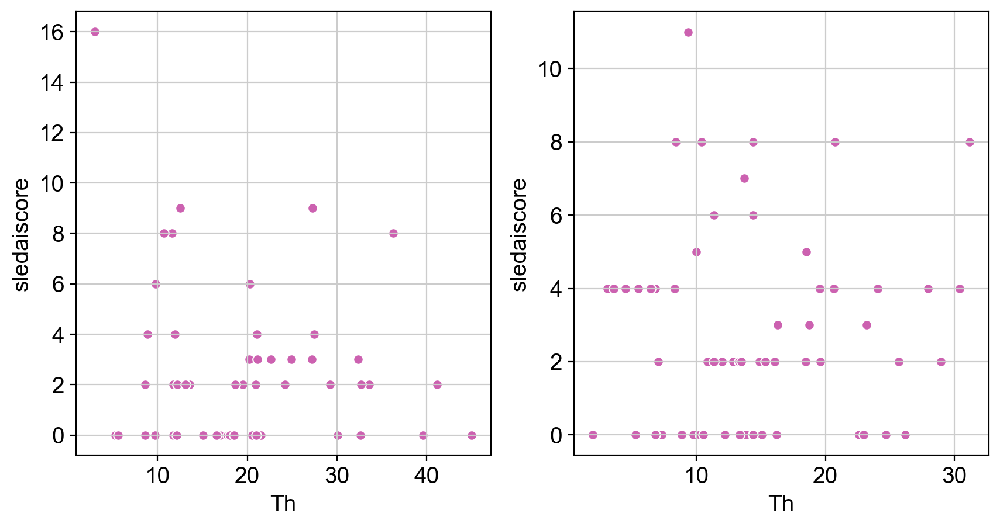

In [55]:
fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,5))

sns.scatterplot(x='Th', y='sledaiscore', data=joined_pivot_perc[joined_pivot_perc.disease_pop_cov=="sleWHITE"], color='#CC61B0',ax=ax[0])
sns.scatterplot(x='Th', y='sledaiscore', data=joined_pivot_perc[joined_pivot_perc.disease_pop_cov=="sleASIAN"], color='#CC61B0',ax=ax[1])

## Plot correlation for monocytes and lymphocytes

(0.9636705439272795, 5.078862069316812e-62)
(0.8806096448814706, 7.689982853953282e-36)


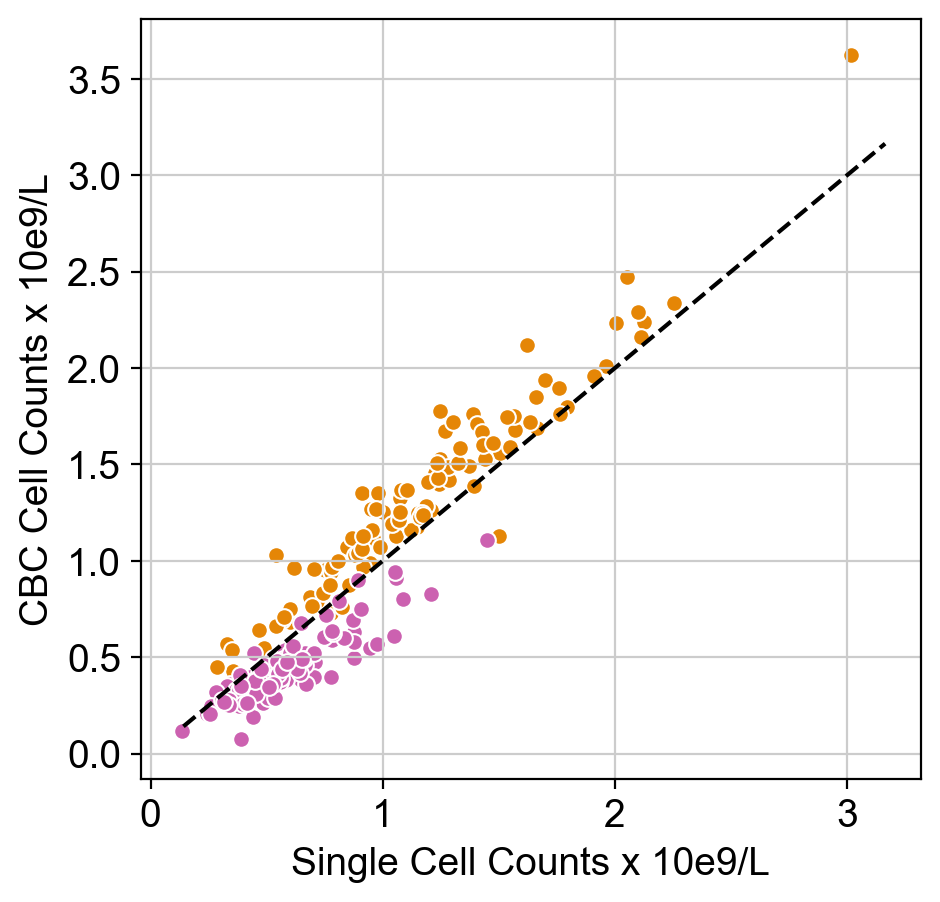

In [56]:
## calculate correlation
lympho_cor = stats.pearsonr(joined_agg_pivot_clues.lymph, joined_agg_pivot_clues.AbsLympho)
mono_cor = stats.pearsonr(joined_agg_pivot_clues.mono, joined_agg_pivot_clues.AbsMono)

fig,ax = plt.subplots(nrows=1,ncols=1, figsize=(5,5))
#fig.tight_layout()

##palette = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E","#A5AA99"]
    
sns.scatterplot(x='lymph', y='AbsLympho', data=joined_agg_pivot_clues, color='#E58606',ax=ax)
ax.plot(ax.get_xlim(), ax.get_xlim(), '--', color='#000000')

sns.scatterplot(x='mono', y='AbsMono', data=joined_agg_pivot_clues, color='#CC61B0',ax=ax)
ax.set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")

##ax[1].set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")
##ax[1].plot(ax[1].get_xlim(), ax[1].get_xlim(), '--', color='#000000')

fig.savefig(figdir+"ct.corr.png")

print(lympho_cor)
print(mono_cor)

(0.8156292855079869, 1.0581637456861e-26)
(0.857581946772425, 4.340316903466864e-32)


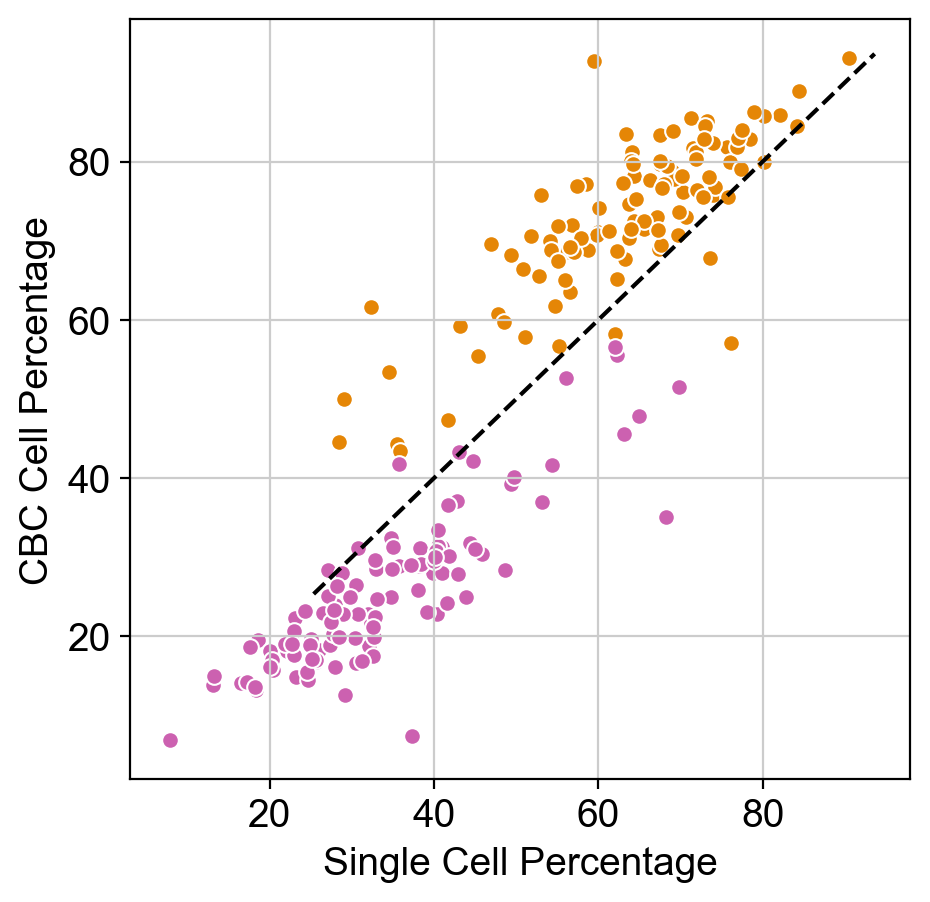

In [57]:
## calculate correlation
lympho_cor = stats.pearsonr(joined_agg_pivot_perc_clues.lymph, joined_agg_pivot_perc_clues.PercLympho)
mono_cor = stats.pearsonr(joined_agg_pivot_perc_clues.mono, joined_agg_pivot_perc_clues.PercMono)

fig,ax = plt.subplots(nrows=1,ncols=1, figsize=(5,5))
#fig.tight_layout()


sns.scatterplot(x='lymph', y='PercLympho', data=joined_agg_pivot_perc_clues, color='#E58606',ax=ax)
ax.plot(ax.get_xlim(), ax.get_xlim(), '--', color='#000000')

sns.scatterplot(x='mono', y='PercMono', data=joined_agg_pivot_perc_clues, color='#CC61B0',ax=ax)
ax.set(xlabel="Single Cell Percentage", ylabel="CBC Cell Percentage")

##ax[1].set(xlabel="Single Cell Counts x 10e9/L", ylabel="CBC Cell Counts x 10e9/L")
##ax[1].plot(ax[1].get_xlim(), ax[1].get_xlim(), '--', color='#000000')

fig.savefig(figdir+"ct.corr.perc.png")

print(lympho_cor)
print(mono_cor)

## Plot cell abundance

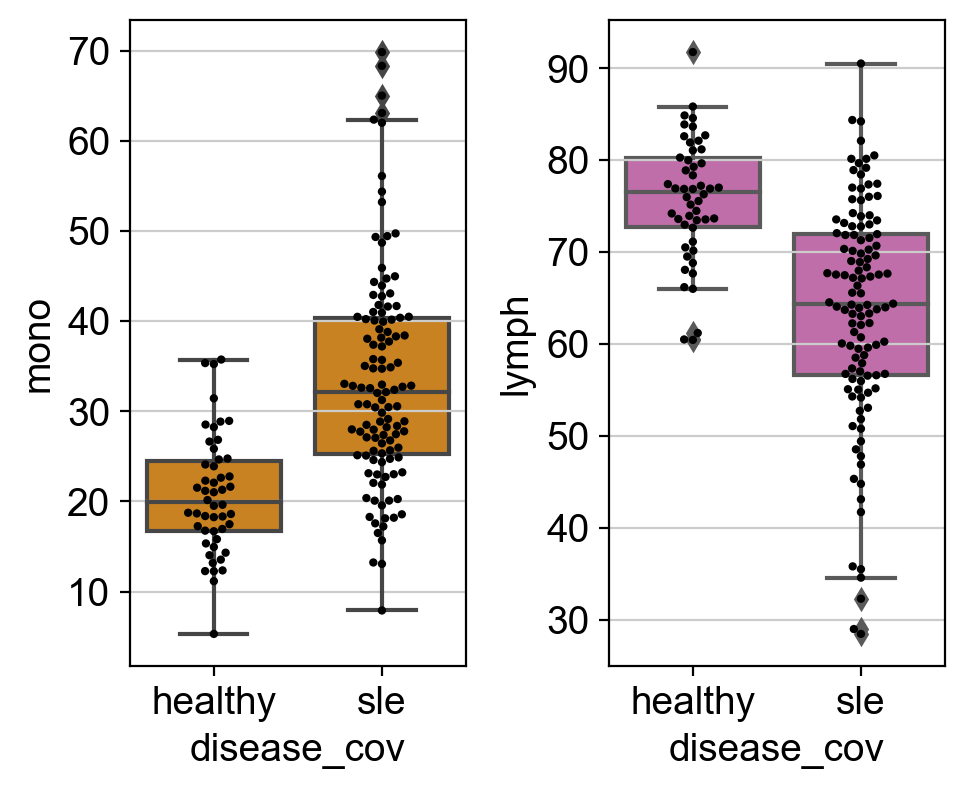

In [58]:
## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
joined_agg_pivot_perc.disease_cov = pd.Categorical(joined_agg_pivot_perc.disease_cov,categories=['healthy','sle'], ordered=True)



fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(5,4))
fig.tight_layout()

for cg_i in [0, 1] :
    cg = ['mono', 'lymph'][cg_i]
##    sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color=['#F47F20','#8559A5','#7f7f7f'][cg_i], ax=ax[cg_i])
##    sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])
    sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.mono == 0)], color=["#E58606","#CC61B0",'#7f7f7f'][cg_i], ax=ax[cg_i])
    sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.mono == 0)], color="0", size=3, ax=ax[cg_i])

    
fig.savefig(figdir+"/mono.lymph.perc.png")

## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

# ##joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
# joined_agg_pivot_perc.disease_cov = pd.Categorical(joined_agg_pivot_perc.disease_cov,categories=['healthy','sle'], ordered=True)


# fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
# fig.tight_layout()

# for cg_i in [0, 1,2] :
#     cg = ['mono', 'lymph','lymph'][cg_i]
#     sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color=['#ff7f0e','#d62728','#7f7f7f'][cg_i], ax=ax[cg_i])
#     sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])


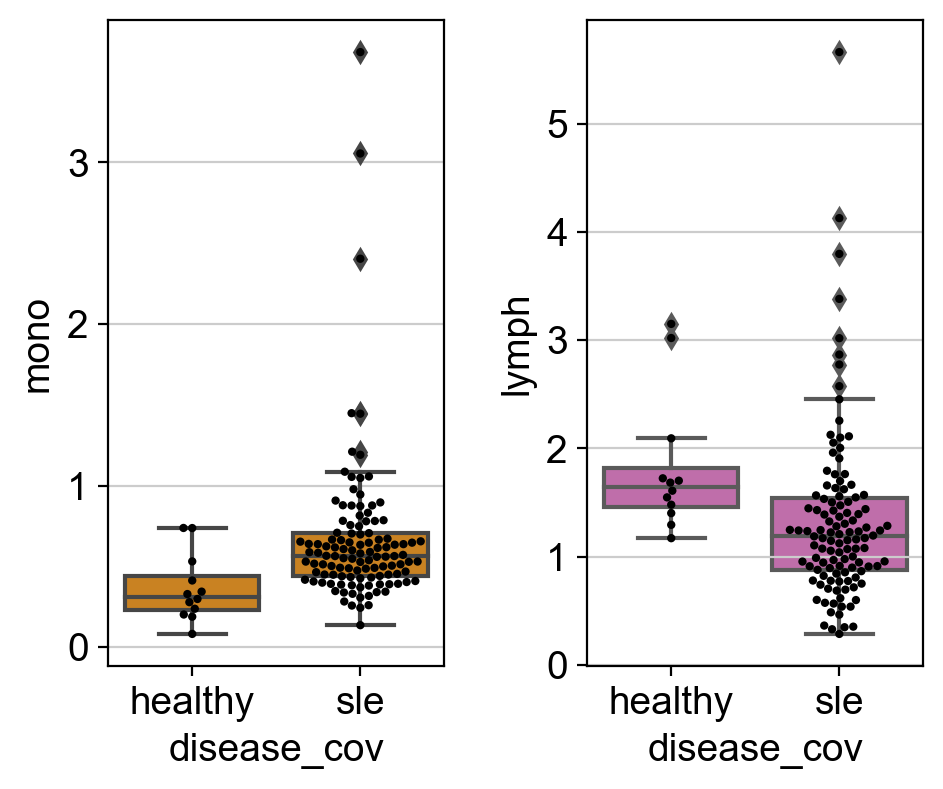

In [59]:
## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
joined_agg_pivot.disease_cov = pd.Categorical(joined_agg_pivot.disease_cov,categories=['healthy','sle'], ordered=True)


fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(5,4))
fig.tight_layout()

for cg_i in [0, 1] :
    cg = ['mono', 'lymph'][cg_i]
##    sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color=['#F47F20','#8559A5','#7f7f7f'][cg_i], ax=ax[cg_i])
##    sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])
    sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.mono == 0)], color=["#E58606","#CC61B0",'#7f7f7f'][cg_i], ax=ax[cg_i])
    sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.mono == 0)], color="0", size=3, ax=ax[cg_i])

    

## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

# ##joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
# joined_agg_pivot_perc.disease_cov = pd.Categorical(joined_agg_pivot_perc.disease_cov,categories=['healthy','sle'], ordered=True)


# fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
# fig.tight_layout()

# for cg_i in [0, 1,2] :
#     cg = ['mono', 'lymph','lymph'][cg_i]
#     sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color=['#ff7f0e','#d62728','#7f7f7f'][cg_i], ax=ax[cg_i])
#     sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])


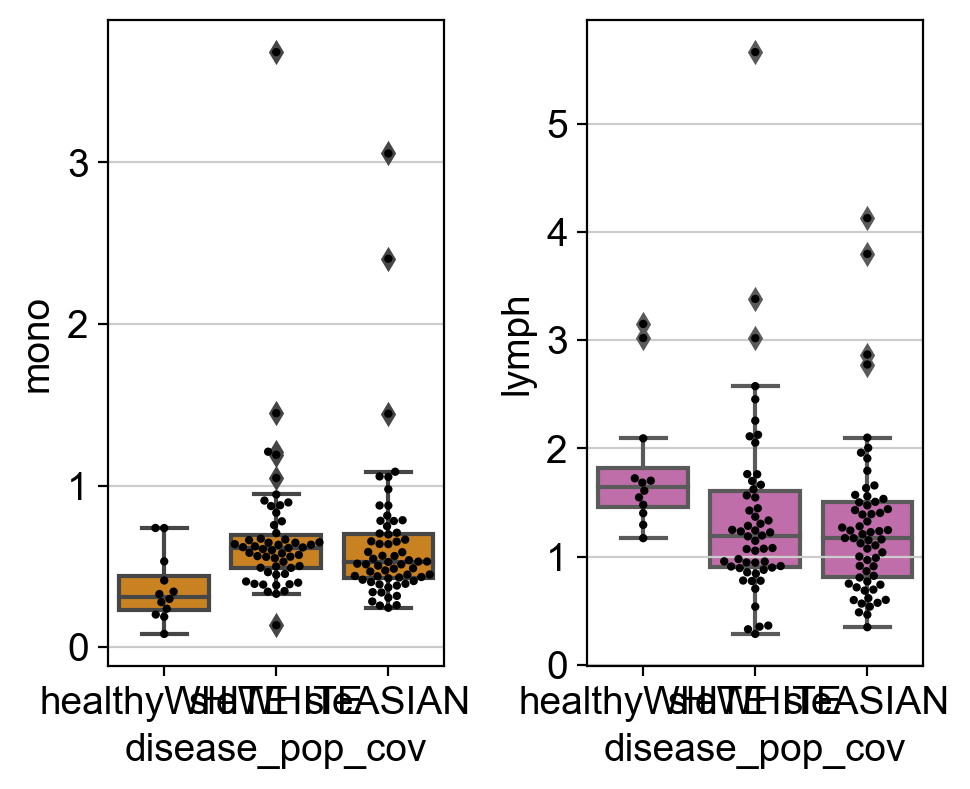

In [60]:
## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

joined_agg.disease_pop_cov = pd.Categorical(joined_agg.disease_pop_cov,categories=['healthyWHITE','sleWHITE','sleASIAN'], ordered=True)
joined_agg_pivot.disease_pop_cov = pd.Categorical(joined_agg_pivot.disease_pop_cov,categories=['healthyWHITE','sleWHITE','sleASIAN'], ordered=True)


fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(5,4))
fig.tight_layout()

for cg_i in [0, 1] :
    cg = ['mono', 'lymph'][cg_i]
    sns.boxplot(x="disease_pop_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.mono == 0)], color=["#E58606","#CC61B0",'#7f7f7f'][cg_i], ax=ax[cg_i])
    sns.swarmplot(x="disease_pop_cov", y=cg, data=joined_agg_pivot[~(joined_agg_pivot.mono == 0)], color="0", size=3, ax=ax[cg_i])

    
## now let's also plot the monocyte and lymphocyte counts between sle and control
## immvar samples are
##IGTB1290 IGTB1372 IGTB141 IGTB143 IGTB1506 IGTB1539 IGTB1540 IGTB1542 IGTB1575 IGTB1650 IGTB1921 IGTB195 IGTB256 IGTB469 IGTB498 IGTB508 IGTB514 IGTB645 IGTB670 IGTB826 IGTB884 IGTB986

# ##joined_agg.disease_cov = pd.Categorical(joined_agg.disease_cov,categories=['healthy','sle'], ordered=True)
# joined_agg_pivot_perc.disease_cov = pd.Categorical(joined_agg_pivot_perc.disease_cov,categories=['healthy','sle'], ordered=True)


# fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(10,8))
# fig.tight_layout()

# for cg_i in [0, 1,2] :
#     cg = ['mono', 'lymph','lymph'][cg_i]
#     sns.boxplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color=['#ff7f0e','#d62728','#7f7f7f'][cg_i], ax=ax[cg_i])
#     sns.swarmplot(x="disease_cov", y=cg, data=joined_agg_pivot_perc[~(joined_agg_pivot_perc.AbsMono < 5/1000)], color="0", size=3, ax=ax[cg_i])


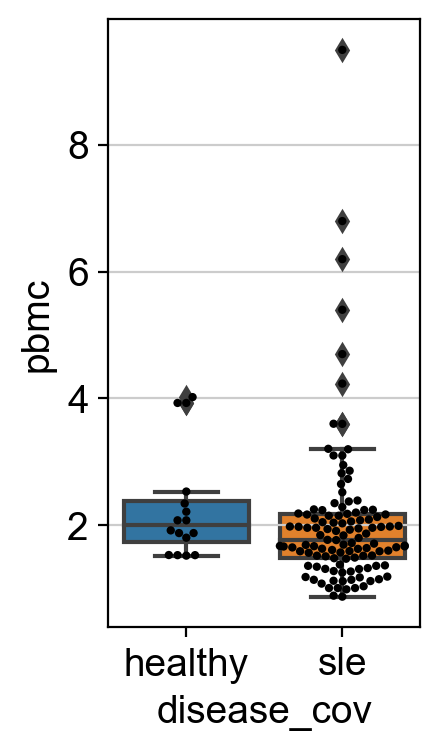

In [61]:
fig,ax = plt.subplots()
fig.set_size_inches(2,4)
ax = sns.boxplot(x="disease_cov", y="pbmc", data=joined_pivot[~(joined_pivot.pbmc == 0)])
ax = sns.swarmplot(x="disease_cov", y="pbmc", data=joined_pivot[~(joined_pivot.pbmc == 0)], color="0", size=3)


Cell type:DB,Race:White or Caucasian
Beta=0.026421768048559943, pvalue=0.2565056384820724
Cell type:DB,Race:Black or African American
Beta=-0.044733193277310776, pvalue=0.2162833942916536
Cell type:DB,Race:Asian
Beta=-0.015488095238095263, pvalue=0.49572182043367674
Cell type:DB,Race:White or Caucasian
Beta=-0.49909482758620743, pvalue=8.000617380531977e-09
Cell type:DB,Race:Black or African American
Beta=-0.7360336134453775, pvalue=0.00018111041389387442
Cell type:DB,Race:Asian
Beta=-0.7384702380952382, pvalue=1.6596356087009966e-14


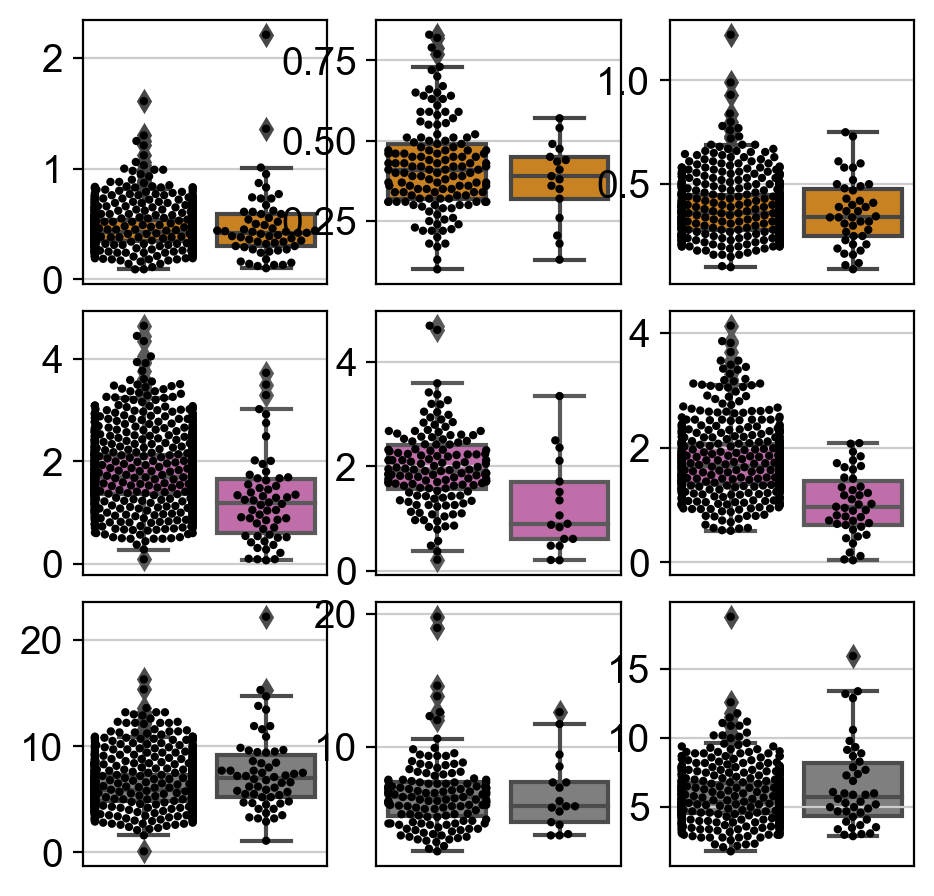

In [62]:
## Now let's analyze the EHR data
ehr = pd.read_table("meena_lupus_2017-11-15.csv", sep=",")
ehr_pivot = ehr.pivot_table(index=['Patient_ID',"Lab_Age","Patient_Sex","Patient_Race","CASE"],columns="Lab_Name",values="Lab_Value")
ehr_pivot.reset_index(inplace=True)
ehr_pivot = ehr_pivot[ehr_pivot['monocyte abs count'] < 5]
ehr_pivot = ehr_pivot[ehr_pivot['lymphocyte abs cnt'] < 6]

fig,ax = plt.subplots(nrows=3,ncols=3, figsize=(5,5))
fig.tight_layout()
plt.subplots_adjust(wspace=0.2, hspace=0.1)

## find samples with both monocyte and lymphocyte count
for cg_i in [0, 1, 2] :
    cg = ['monocyte abs count', 'lymphocyte abs cnt', 'wbc count'][cg_i]
    for r_i in [0,1,2] :
        race = ['White or Caucasian', 'Black or African American', 'Asian'][r_i]
        ##palette = ["#E58606","#5D69B1","#52BCA3","#99C945","#CC61B0","#24796C","#DAA51B","#2F8AC4","#764E9F","#ED645A","#CC3A8E","#A5AA99"]
        sns.boxplot(x="CASE", y=cg, data=ehr_pivot[ehr_pivot.Patient_Race==race], color=["#E58606","#CC61B0",'#7f7f7f'][cg_i], ax=ax[cg_i,r_i])
        sns.swarmplot(x="CASE", y=cg, data=ehr_pivot[ehr_pivot.Patient_Race==race], color="0", size=3, ax=ax[cg_i,r_i])
        ax[cg_i,r_i].get_xaxis().set_visible(False)
        ax[cg_i,r_i].get_yaxis().label.set_visible(False)


fig.savefig(figdir+"/ehr.boxplot.png")

##perc_plot = sns.catplot(x='CASE', y='Lab_Value', col='Lab_Name', data=ehr, kind='violin', row='Patient_Race', dodge=False, aspect=0.4, sharex=False, sharey=False)

## test for differences in abundance
for cg_i in [0, 1] :
    cg = ['monocyte abs count', 'lymphocyte abs cnt'][cg_i]
    for race in ['White or Caucasian', 'Black or African American', 'Asian'] :
        abundance = ehr_pivot[ehr_pivot.Patient_Race==race][cg].values
        disease = ehr_pivot.CASE[ehr_pivot.Patient_Race==race]
        disease = sm.add_constant(disease)
        print('Cell type:'+ ct +",Race:"+race)
        est=sm.OLS(abundance.astype(float), disease.astype(float))
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        print('Beta='+str(effect)+', pvalue='+str(pval))
        


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]


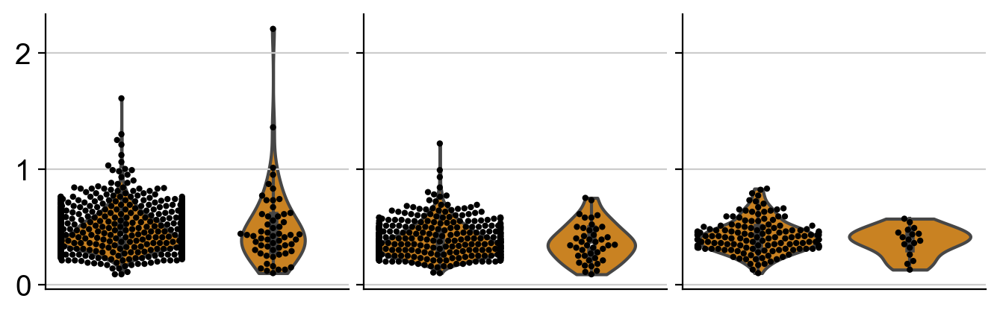

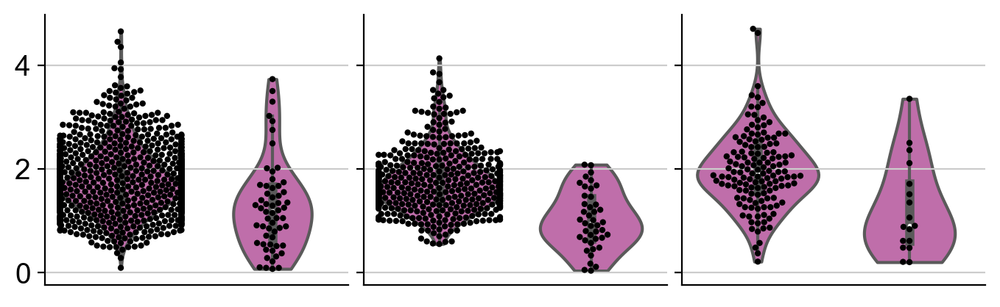

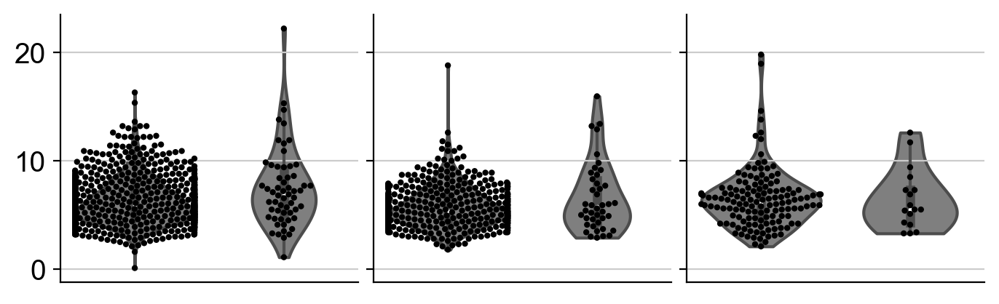

In [63]:
## Now let's analyze the EHR data
ehr_pivot_small = ehr_pivot[ehr_pivot.Patient_Race.isin(['White or Caucasian', 'Black or African American', 'Asian'])]

ehr_pivot_small_melt = ehr_pivot_small.melt(id_vars=['Patient_Race','CASE'], value_vars=["lymphocyte abs cnt", "monocyte abs count", "wbc count"])

for cg_i in [0, 1, 2] :
    cg = ['monocyte abs count', 'lymphocyte abs cnt', 'wbc count'][cg_i]
    ehr_plot = sns.catplot(x='CASE', y=cg, col='Patient_Race', data=ehr_pivot_small, kind='violin', color=["#E58606","#CC61B0",'#7f7f7f'][cg_i], height = 3, aspect=0.9, dodge=False, sharex=False, sharey=True, cut=0)
    ehr_plot.fig.subplots_adjust(wspace=0.05)
    
    for r_i in [0,1,2] :
        race = ['White or Caucasian', 'Asian', 'Black or African American'][r_i]
        sns.swarmplot(x="CASE", y=cg, data=ehr_pivot_small[ehr_pivot.Patient_Race==race], color="0", size=3, ax=ehr_plot.axes[0,r_i])
        ehr_plot.axes[0,r_i].get_yaxis().label.set_visible(False)
        ehr_plot.axes[0,r_i].get_xaxis().label.set_visible(False)
        ehr_plot.axes[0,r_i].get_xaxis().set_visible(False)
        ##ehr_plot.axes[0,r_i].get_xaxis().ticklabels.set_visible(False)
        ##ehr_plot.axes[0,r_i].setxaxislabelsticklabels.set_visible(False)
        ehr_plot.set_titles(row_template = '', col_template = '')

    ##ax[cg_i,r_i].get_xaxis().set_visible(False)
    ##ax[cg_i,r_i].get_yaxis().label.set_visible(False)
    ##    ehr_plot.set_xticklabels(rotation=90)
    ehr_plot.savefig(figdir+cg+".violin.ehr.png")

##fig.savefig(figdir+"/ehr.violin.png")

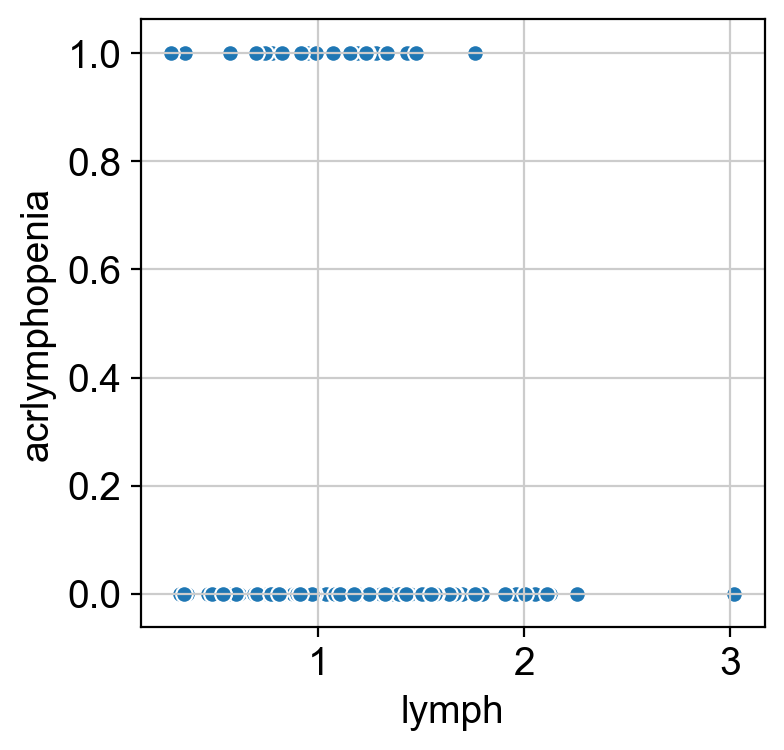

In [64]:
sns.scatterplot(joined_agg_pivot_clues.lymph, joined_agg_pivot_clues.acrlymphopenia)

## test

In [65]:
ifn = pd.read_table("v2.ifn.sig.txt", sep=" ", index_col=False)
ifn.name = ifn.name.apply(lambda x: x.split('_')[0])
joined2 = ifn.join(joined.set_index("ind_cov"), on="name")
joined_pivot2 = joined2.pivot_table(index=['name',"disease_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="estimate")
joined_pivot2.reset_index(inplace=True)

print(joined_pivot2[joined_pivot2.pbmc < 0])
joined_pivot2 = joined_pivot2[joined_pivot2.pbmc > 0]

print(joined_pivot2[joined_pivot2.pbmc > 10])
joined_pivot2 = joined_pivot2[joined_pivot2.pbmc < 10]


Empty DataFrame
Columns: [name, disease_cov, pbmc, ifn, plaquenilnow, cellceptnow, steroralnow, acrlymphopenia, B, DB, MK, NK, Progen, ProlifT, Tc, Th, cDC, cM, ncM, pDC]
Index: []
Empty DataFrame
Columns: [name, disease_cov, pbmc, ifn, plaquenilnow, cellceptnow, steroralnow, acrlymphopenia, B, DB, MK, NK, Progen, ProlifT, Tc, Th, cDC, cM, ncM, pDC]
Index: []


In [66]:
joined2.ct_cov = joined2.ct_cov.astype("category")
joined2.ct_cov = joined2.ct_cov.cat.reorder_categories(['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B', 'MK', 'Progen', 'DB'])

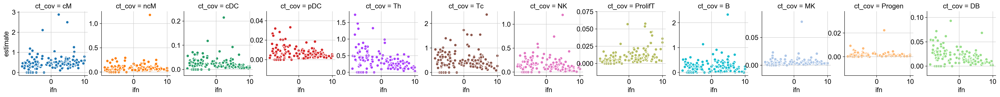

In [67]:
g = sns.FacetGrid(joined2, col="ct_cov",  hue="ct_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
g = g.map(plt.scatter, "ifn", "estimate", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/ifn.ct_cov.png")

In [68]:
ifn = pd.read_table("v2.ifn.sig.txt", sep=" ", index_col=False)
ifn.name = ifn.name.apply(lambda x: x.split('_')[0])
joined2 = ifn.join(joined.set_index("ind_cov"), on="name")
joined_pivot2 = joined2.pivot_table(index=['name',"disease_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="ct_perc")
joined_pivot2.reset_index(inplace=True)

print(joined_pivot2[joined_pivot2.pbmc < 0])
joined_pivot2 = joined_pivot2[joined_pivot2.pbmc > 0]

print(joined_pivot2[joined_pivot2.pbmc > 10])
joined_pivot2 = joined_pivot2[joined_pivot2.pbmc < 10]


Empty DataFrame
Columns: [name, disease_cov, pbmc, ifn, plaquenilnow, cellceptnow, steroralnow, acrlymphopenia, B, DB, MK, NK, Progen, ProlifT, Tc, Th, cDC, cM, ncM, pDC]
Index: []
Empty DataFrame
Columns: [name, disease_cov, pbmc, ifn, plaquenilnow, cellceptnow, steroralnow, acrlymphopenia, B, DB, MK, NK, Progen, ProlifT, Tc, Th, cDC, cM, ncM, pDC]
Index: []


In [69]:
joined2.ct_cov = joined2.ct_cov.astype("category")
joined2.ct_cov = joined2.ct_cov.cat.reorder_categories(['cM', 'ncM', 'cDC', 'pDC', 'Th', 'Tc', 'NK', 'ProlifT', 'B', 'MK', 'Progen','DB'])

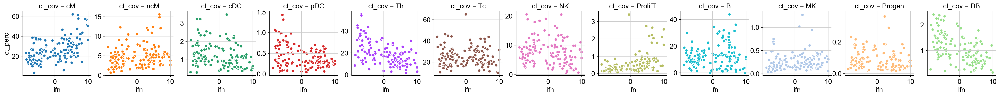

In [70]:
g = sns.FacetGrid(joined2, col="ct_cov",  hue="ct_cov", aspect=0.8, height=3, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
g = g.map(plt.scatter, "ifn", "ct_perc", edgecolor="w")
g.fig.subplots_adjust(wspace=0.2)
g.savefig(figdir+"/ifn.ct_cov.png")

# Supplementary figures

## Take a look at the effects of treatment

In [71]:
cg_cov = pd.DataFrame( {'ct_cov':['B','cM','ncM', 'Th', 'Tc', 'NK', 'ProlifT', 'cDC', 'pDC', 'MK', 'Progen'], 'cg_cov':['lymph', 'mono', 'mono', 'lymph','lymph', 'lymph', 'lymph', 'cdc','pdc', 'mk', 'progen']})

ct_cov = joined.ct_cov.astype('category')

## filter only for sle
joined_sle = joined[joined.disease_cov == "sle"]

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    print(drug)
    for ct_i in list(range(11)) :
        ct = ct_cov.cat.categories[ct_i]
        ct_perc = joined_sle.ct_perc[joined_sle.ct_cov==ct]
        drug_cov = joined_sle[drug][joined_sle.ct_cov==ct]
        drug_cov = sm.add_constant(drug_cov)

        print('Cell type:'+ ct)
        est=sm.OLS(ct_perc.astype(float), drug_cov.astype(float))
        est=est.fit()
        effect=est.params[1]
        pval=est.pvalues[1]
        print('Beta='+str(effect)+', pvalue='+str(pval))
        
    
    

plaquenilnow
Cell type:B
Beta=-3.949499268882546, pvalue=0.023224093035776463
Cell type:DB
Beta=0.06417098444384509, pvalue=0.5135532197340009
Cell type:MK
Beta=0.06902626296145109, pvalue=0.06488171732255865
Cell type:NK
Beta=-0.1720877237419638, pvalue=0.8419614536476483
Cell type:Progen
Beta=0.00959773258453405, pvalue=0.4906823771012562
Cell type:ProlifT
Beta=0.10894278197529594, pvalue=0.3701849533002869
Cell type:Tc
Beta=-1.2360966331132928, pvalue=0.5018352242459477
Cell type:Th
Beta=3.662037760822775, pvalue=0.02846265546675209
Cell type:cDC
Beta=0.05864026447868961, pvalue=0.654857051168487
Cell type:cM
Beta=1.8371605487829403, pvalue=0.40398516660151584
Cell type:ncM
Beta=-0.503322532790009, pvalue=0.3797457705338755
cellceptnow
Cell type:B
Beta=0.6189707418911083, pvalue=0.7324266514223428
Cell type:DB
Beta=-0.13762940902517223, pvalue=0.17186734653022911
Cell type:MK
Beta=0.05758259919182884, pvalue=0.13546276781864972
Cell type:NK
Beta=1.198187121942118, pvalue=0.175517110

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


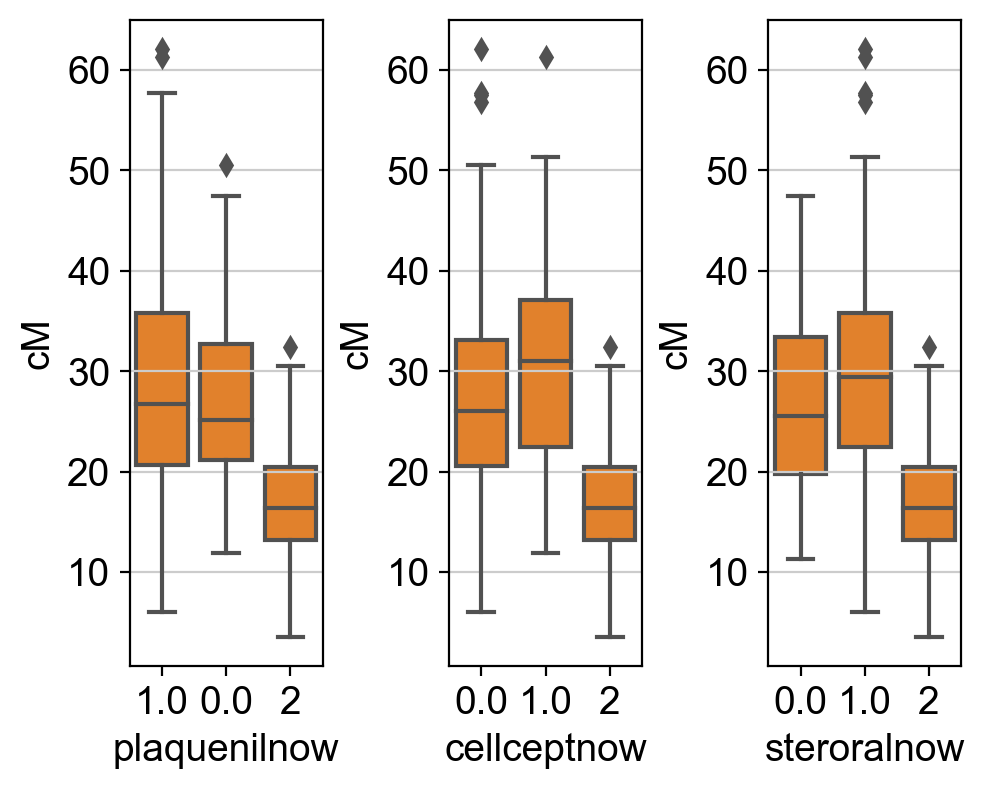

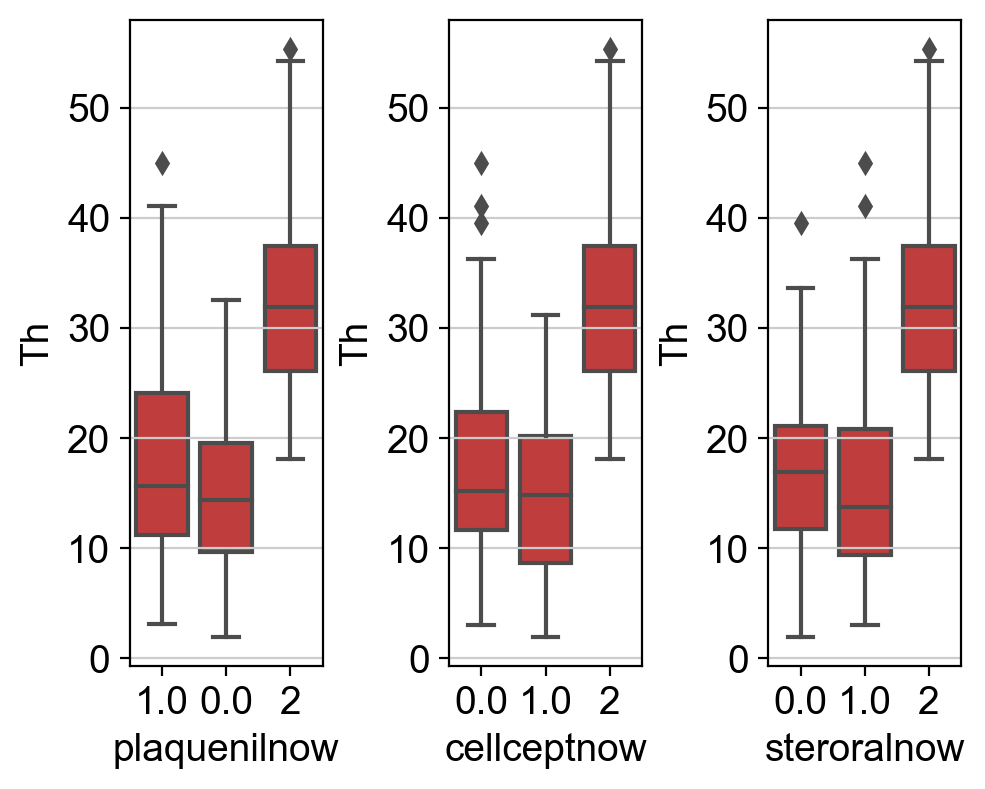

In [72]:
fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(5,4))
fig.tight_layout()

joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_cov=="healthy")] = "2";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_cov=="healthy")] = "2";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_cov=="healthy")] = "2";

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    sns.boxplot(x=drug, y="cM", data=joined_pivot_perc, color='#ff7f0e', ax=ax[drug_i])

fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(5,4))
fig.tight_layout()

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    sns.boxplot(x=drug, y="Th", data=joined_pivot_perc, color='#d62728', ax=ax[drug_i])


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set 

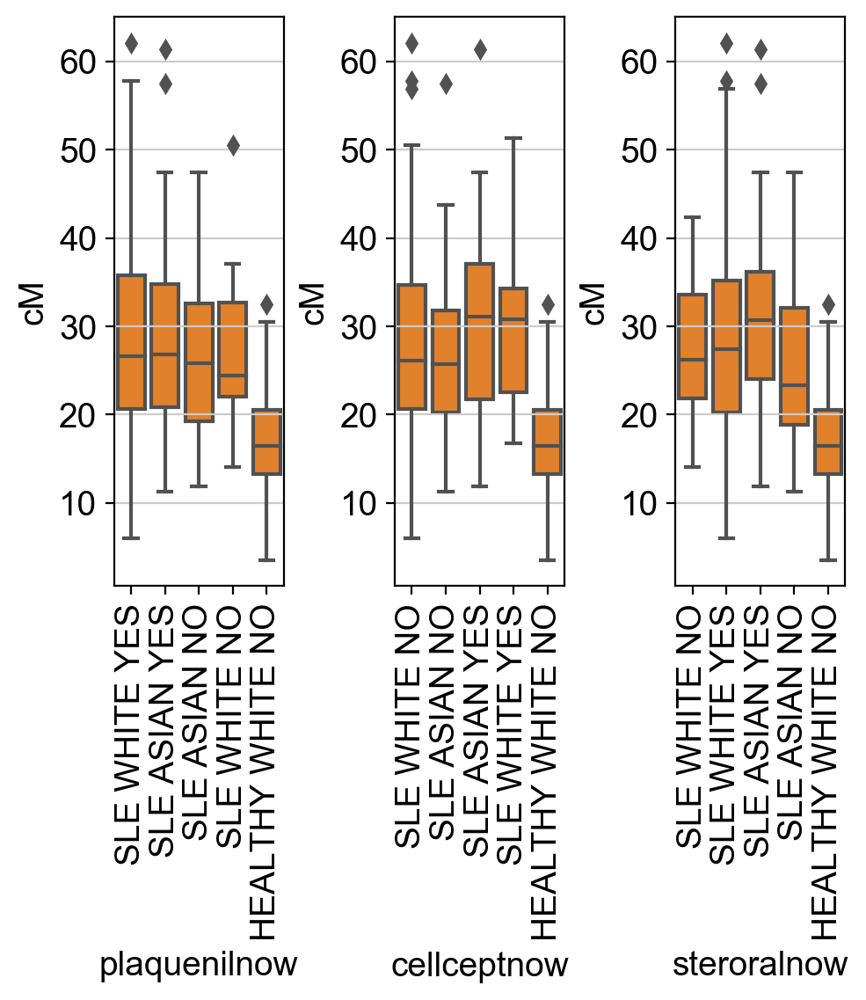

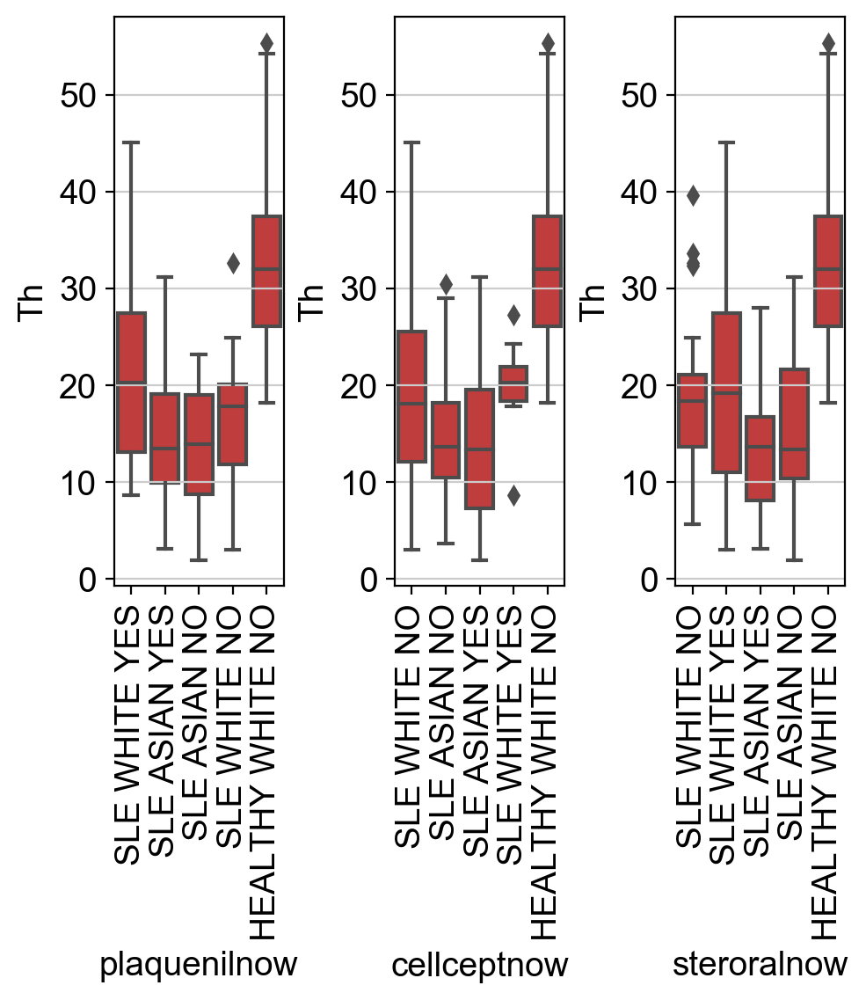

In [73]:
fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(5,4))
fig.tight_layout()

joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="healthyWHITE")] = "HEALTHY WHITE NO";
joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.plaquenilnow==1)] = "SLE WHITE YES";
joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.plaquenilnow==0)] = "SLE WHITE NO";
joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.plaquenilnow==1)] = "SLE ASIAN YES";
joined_pivot_perc.plaquenilnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.plaquenilnow==0)] = "SLE ASIAN NO";

joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="healthyWHITE")] = "HEALTHY WHITE NO";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.cellceptnow==1)] = "SLE WHITE YES";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.cellceptnow==0)] = "SLE WHITE NO";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.cellceptnow==1)] = "SLE ASIAN YES";
joined_pivot_perc.cellceptnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.cellceptnow==0)] = "SLE ASIAN NO";

joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="healthyWHITE")] = "HEALTHY WHITE NO";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.steroralnow==1)] = "SLE WHITE YES";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="sleWHITE") & (joined_pivot_perc.steroralnow==0)] = "SLE WHITE NO";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.steroralnow==1)] = "SLE ASIAN YES";
joined_pivot_perc.steroralnow[(joined_pivot_perc.disease_pop_cov=="sleASIAN") & (joined_pivot_perc.steroralnow==0)] = "SLE ASIAN NO";

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    p = sns.boxplot(x=drug, y="cM", data=joined_pivot_perc, color='#ff7f0e', ax=ax[drug_i])
    p.set_xticklabels(ax[drug_i].get_xticklabels(), rotation=90)
    
fig,ax = plt.subplots(nrows=1,ncols=3, figsize=(5,4))
fig.tight_layout()

for drug_i in [0, 1,2] :
    drug = ["plaquenilnow", "cellceptnow", "steroralnow"][drug_i]
    ##cg = ['mono', 'lymph','lymph'][cg_i]
    p = sns.boxplot(x=drug, y="Th", data=joined_pivot_perc, color='#d62728', ax=ax[drug_i])
    p.set_xticklabels(ax[drug_i].get_xticklabels(), rotation=90)
